In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import scipy as sp
from statsmodels.stats.multitest import multipletests
import matplotlib.pyplot as plt
import seaborn as sns
import os
import time
from gprofiler import GProfiler

# scTRS tools
import scTRS.util as util
import scTRS.data_loader as dl
import scTRS.method as md

# autoreload
%load_ext autoreload
%autoreload 2
# logging
sc.logging.print_versions()

scanpy==1.5.1 anndata==0.7.4 umap==0.4.6 numpy==1.19.0 scipy==1.5.1 pandas==1.0.5 scikit-learn==0.23.1 statsmodels==0.11.1


In [2]:
# Setup file paths
DATA_PATH = '/n/holystore01/LABS/price_lab/Users/mjzhang/scTRS_data'
# Please change this to your own path
RESULT_PATH = '/n/home11/mjzhang/gwas_informed_scRNAseq/results'

### Load TMS data 

In [3]:
# Count data (used for scoring genes)
start_time = time.time()
data_facs_ct = dl.load_tms_ct(DATA_PATH, data_name='facs')
print('# TMS facs count data: n_cell=%d, n_gene=%d'
      %(data_facs_ct.shape[0], data_facs_ct.shape[1]))
print('# time=%0.1fs'%(time.time() - start_time))

Trying to set attribute `.obs` of view, copying.


# TMS facs count data: n_cell=110096, n_gene=22966
# time=17.2s


In [4]:
# Processed data from TMS official release
start_time = time.time()
dic_data_facs = dl.load_tms_processed(DATA_PATH, data_name='facs', tissue='all')
for tissue in dic_data_facs.keys():
    print('# TMS facs %s: n_cell=%d, n_gene=%d'
          %(tissue, dic_data_facs[tissue].shape[0], dic_data_facs[tissue].shape[1]))
print('# time=%0.1fs'%(time.time() - start_time))

# load_tms_processed: load facs data, tissue=[Aorta, BAT, Bladder, Brain_Myeloid, Brain_Non-Myeloid, Diaphragm, GAT, Heart, Kidney, Large_Intestine, Limb_Muscle, Liver, Lung, MAT, Mammary_Gland, Marrow, Pancreas, SCAT, Skin, Spleen, Thymus, Tongue, Trachea]


/n/home11/mjzhang/myenv/lib/python3.7/site-packages/anndata/compat/__init__.py:161: FutureWarning: Moving element from .uns['neighbors']['distances'] to .obsp['distances'].

This is where adjacency matrices should go now.
  FutureWarning,
/n/home11/mjzhang/myenv/lib/python3.7/site-packages/anndata/compat/__init__.py:161: FutureWarning: Moving element from .uns['neighbors']['connectivities'] to .obsp['connectivities'].

This is where adjacency matrices should go now.
  FutureWarning,


# TMS facs Aorta: n_cell=906, n_gene=22966
# TMS facs BAT: n_cell=2223, n_gene=22966
# TMS facs Bladder: n_cell=2432, n_gene=22966
# TMS facs Brain_Myeloid: n_cell=13417, n_gene=22966
# TMS facs Brain_Non-Myeloid: n_cell=7249, n_gene=22966
# TMS facs Diaphragm: n_cell=1858, n_gene=22966
# TMS facs GAT: n_cell=3406, n_gene=22966
# TMS facs Heart: n_cell=9669, n_gene=22966
# TMS facs Kidney: n_cell=1833, n_gene=22966
# TMS facs Large_Intestine: n_cell=8311, n_gene=22966
# TMS facs Limb_Muscle: n_cell=3855, n_gene=22966
# TMS facs Liver: n_cell=2859, n_gene=22966
# TMS facs Lung: n_cell=5218, n_gene=22966
# TMS facs MAT: n_cell=3014, n_gene=22966
# TMS facs Mammary_Gland: n_cell=3282, n_gene=22966
# TMS facs Marrow: n_cell=14517, n_gene=22966
# TMS facs Pancreas: n_cell=3384, n_gene=22966
# TMS facs SCAT: n_cell=3755, n_gene=22966
# TMS facs Skin: n_cell=4860, n_gene=22966
# TMS facs Spleen: n_cell=3834, n_gene=22966
# TMS facs Thymus: n_cell=4047, n_gene=22966
# TMS facs Tongue: n_cell=3

### Load gene annotation

In [5]:
# Get 64 independent traits 
df_sumstats_meta = pd.read_excel(DATA_PATH+'/sumstats/Description_080419.xlsx',
                                 sheet_name='64 Recommended indepent traits')
df_sumstats_meta = df_sumstats_meta[['Trait_Identifier', 'h2g', 'Z', 'N']]

In [6]:
# MAGMA gene annotation
df_geneannot = pd.read_csv(DATA_PATH+'/gene_annotation/Genes_by_X_kushal/Genes_by_X_MAGMA_10kb_Z.txt', sep='\t')
print('# MAGMA annotation: n_gene=%d, n_trait=%d'%(df_geneannot.shape[0], df_geneannot.shape[1]))

# Ortholog genes 
# (computed using following two lines of codes, stored to void dulplicated computation )
# gp = GProfiler(return_dataframe=True)
# df_orth = gp.orth(organism='hsapiens', query=list(df_geneannot.index), target='mmusculus')
df_orth = pd.read_csv(DATA_PATH+'/gene_annotation/Genes_by_X_kushal/Genes_by_X_MAGMA_10kb_Z.orth.txt', sep='\t')

# Use only human genes that can be uniquely mapped to a mouse gene
temp_df = df_orth.groupby(['incoming']).agg({'name':len})
gene_list = list(temp_df.index[temp_df['name']==1])
gene_list.sort()
df_orth.index = df_orth['incoming']
df_orth = df_orth.loc[gene_list]
print('# MAGMA annotation: n_mouse_gene_converted=%d'%(df_orth.shape[0]))

# Change df_geneannot genes to mouse genes
dic_mapping = {df_orth['incoming'].values[x]:df_orth['name'].values[x] for x in np.arange(df_orth.shape[0])}
df_geneannot = df_geneannot.loc[gene_list]
df_geneannot.index = [dic_mapping[x] for x in df_geneannot.index]

# MAGMA annotation: n_gene=19427, n_trait=169
# MAGMA annotation: n_mouse_gene_converted=15832


### Trait association

In [7]:
# Precompute mean and var 
md.compute_stats(data_facs_ct)

In [16]:
trait_list = ['PASS_MDD_Howard2019', 'PASS_MDD_Wray2018',
              'PASS_ADHD_Demontis2018', 
              'PASS_Schizophrenia_Pardinas2018', 'PASS_Schizophrenia_Ruderfer2018',
              'PASS_BipolarDisorder_Ruderfer2018', 
              'PASS_Depression_Nagel2018', 'PASS_Neuroticism_Nagel2018', 'PASS_Worry_Nagel2018',
              'PASS_Intelligence_SavageJansen2018', 'PASS_Alzheimers_Jansen2019', 'PASS_Insomnia_Jansen2019',
              'PASS_AdultOnsetAsthma_Ferreira2019',
              'PASS_Coronary_Artery_Disease', 'PASS_LargeArteryStroke_Malik2018', 
              'PASS_CardioembolicStroke_Malik2018',
              'PASS_HDL', 'UKB_460K.biochemistry_HDLcholesterol',
              'PASS_LDL', 'UKB_460K.biochemistry_LDLdirect',
              'PASS_Rheumatoid_Arthritis', 'PASS_Lupus', 
              'PASS_IBD_deLange2017', 'PASS_IBD',
              'PASS_UC_deLange2017', 'PASS_Ulcerative_Colitis', 'PASS_Crohns_Disease', 
              'PASS_Type_1_Diabetes', 'PASS_Type_2_Diabetes', 'UKB_460K.disease_T2D']

trait_list = ['PASS_Alzheimers_Jansen2019', 'PASS_HDL', 'PASS_LDL', 
              'UKB_460K.biochemistry_HDLcholesterol', 
              'UKB_460K.biochemistry_LDLdirect',
              'PASS_BipolarDisorder_Ruderfer2018',
              'PASS_Schizophrenia_Pardinas2018',
              'PASS_Depression_Nagel2018',
              'PASS_Rheumatoid_Arthritis',
              'PASS_Lupus', 
              'UKB_460K.body_HEIGHTz']

# Known trait-celltype association 
df_annot_assoc = pd.read_excel(DATA_PATH+'/trait_cell_assoc.xlsx')
df_annot_assoc.index = df_annot_assoc['Disease']
df_annot_assoc  = df_annot_assoc.fillna('')

tissue_list = list(set(data_facs_ct.obs['tissue']))
tissue_list.sort()
tc_list = list(set(data_facs_ct.obs['tissue_celltype']))
tc_list.sort()

print('# facs data: n_tissue=%d n_tissue_celltype=%d'%(len(tissue_list), len(tc_list)))

dic_geneset = {}
for trait in trait_list:
    # Find FDR<0.1 genes 
    temp_df = df_geneannot[[trait]].copy()
    temp_df.columns = ['z_score']
    temp_df['p_val'] = 1 - sp.stats.norm.cdf(temp_df['z_score'].values)
    temp_df['fdr'] = multipletests(temp_df['p_val'].values, method='fdr_bh')[1]
    dic_geneset[trait] = temp_df.copy()
    print('# %-40s n_gene=%d'%(trait, (temp_df['fdr'].values<0.1).sum()))

# facs data: n_tissue=23 n_tissue_celltype=207
# PASS_Alzheimers_Jansen2019               n_gene=298
# PASS_HDL                                 n_gene=527
# PASS_LDL                                 n_gene=460
# UKB_460K.biochemistry_HDLcholesterol     n_gene=6229
# UKB_460K.biochemistry_LDLdirect          n_gene=3013
# PASS_BipolarDisorder_Ruderfer2018        n_gene=685
# PASS_Schizophrenia_Pardinas2018          n_gene=2871
# PASS_Depression_Nagel2018                n_gene=517
# PASS_Rheumatoid_Arthritis                n_gene=286
# PASS_Lupus                               n_gene=320
# UKB_460K.body_HEIGHTz                    n_gene=10619


In [17]:
# Obtain TRS
dic_trs = {}
start_time = time.time()
for trait in trait_list:
    
    ind_select = (dic_geneset[trait]['fdr'].values<0.1)
    gene_list = dic_geneset[trait].index[ind_select]
    
    md.score_cell(data_facs_ct, gene_list, suffix='',
                  ctrl_opt='mean_match', trs_opt='vst', bc_opt='empi',
                  n_ctrl=10, n_genebin=200,
                  return_list=['trs_z', 'trs_tp', 'trs_ep', 'trs_ez'], verbose=False)
    
    dic_trs['%s;trs_tp'%(trait)] = data_facs_ct.obs['trs_tp'].values.copy()
    dic_trs['%s;trs_z'%(trait)] = data_facs_ct.obs['trs_z'].values.copy()
    dic_trs['%s;trs_ep'%(trait)] = data_facs_ct.obs['trs_ep'].values.copy()
    dic_trs['%s;trs_ez'%(trait)] = data_facs_ct.obs['trs_ez'].values.copy()
    print('#%-40s time=%0.1fs'%(trait,time.time()-start_time))

#PASS_Alzheimers_Jansen2019               time=10.5s
#PASS_HDL                                 time=21.5s
#PASS_LDL                                 time=32.1s
#UKB_460K.biochemistry_HDLcholesterol     time=62.6s
#UKB_460K.biochemistry_LDLdirect          time=82.3s
#PASS_BipolarDisorder_Ruderfer2018        time=93.2s
#PASS_Schizophrenia_Pardinas2018          time=112.1s
#PASS_Depression_Nagel2018                time=122.9s
#PASS_Rheumatoid_Arthritis                time=133.1s
#PASS_Lupus                               time=143.4s
#UKB_460K.body_HEIGHTz                    time=184.0s


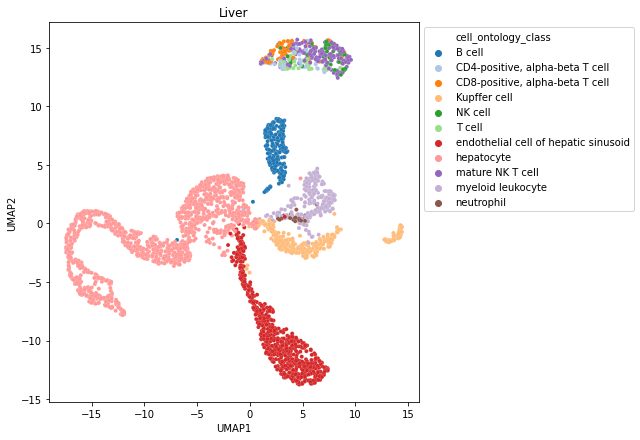

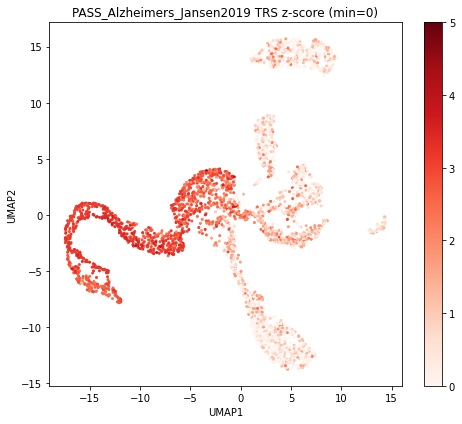

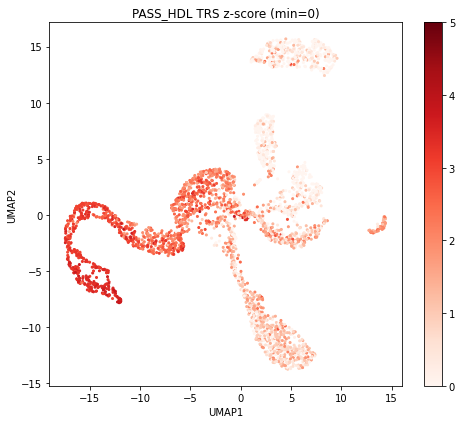

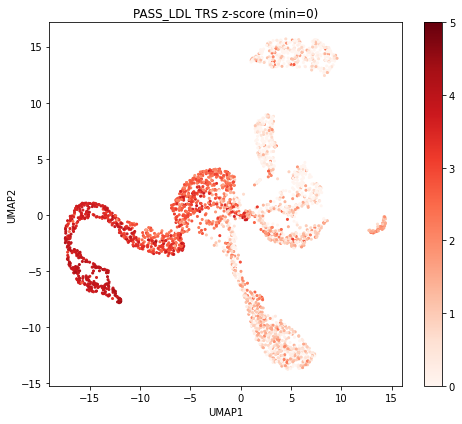

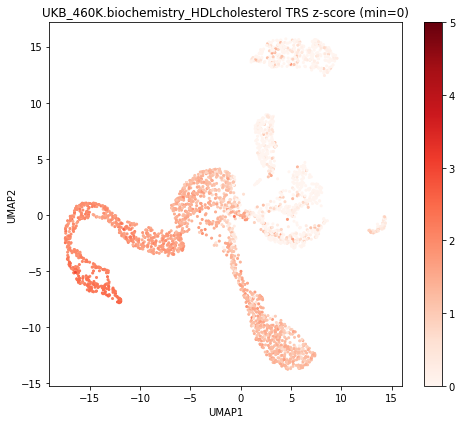

...

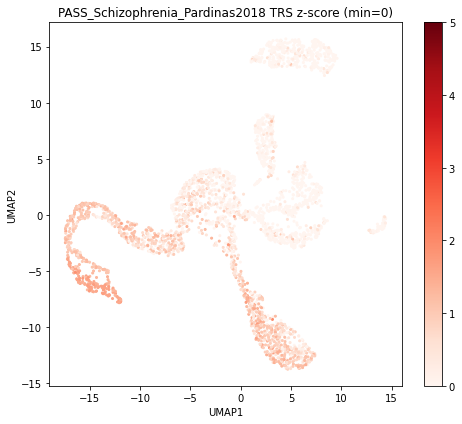

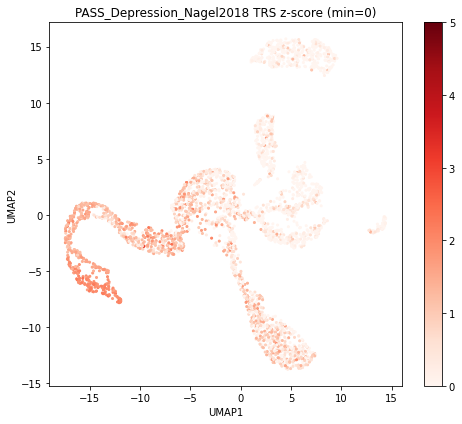

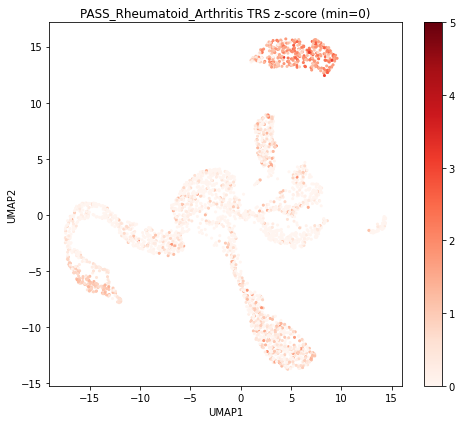

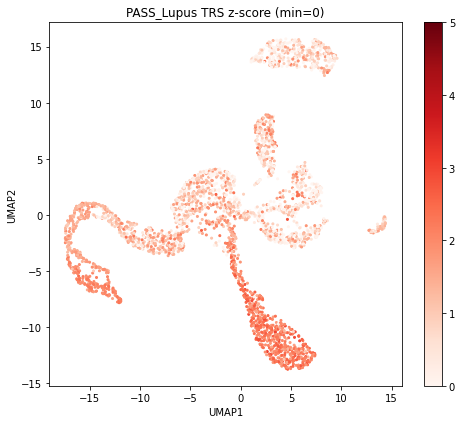

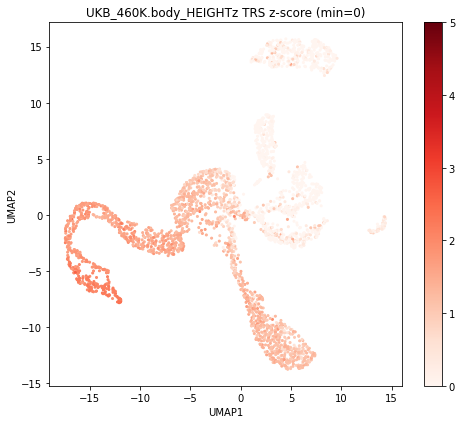

In [18]:
plot_list = [['Liver', 'PASS_Alzheimers_Jansen2019'],
             ['Liver', 'PASS_HDL'],
             ['Liver', 'PASS_LDL'],
             ['Liver', 'UKB_460K.biochemistry_HDLcholesterol'],
             ['Liver', 'UKB_460K.biochemistry_LDLdirect'],
             ['Liver', 'PASS_BipolarDisorder_Ruderfer2018'],
             ['Liver', 'PASS_Schizophrenia_Pardinas2018'],
             ['Liver', 'PASS_Depression_Nagel2018'],
             ['Liver', 'PASS_Rheumatoid_Arthritis'],
             ['Liver', 'PASS_Lupus'],
             ['Liver', 'UKB_460K.body_HEIGHTz']]

tissue_plot = []
for tissue,trait in plot_list:
    
    temp_df = pd.DataFrame(index=data_facs_ct.obs.index)
    temp_df['trs_ep'] = data=dic_trs['%s;trs_ep'%(trait)]
    temp_df['trs_ez'] = data=dic_trs['%s;trs_ez'%(trait)]
    
    df_plot = pd.DataFrame(index=dic_data_facs[tissue].obs.index)
    df_plot['UMAP1'] = dic_data_facs[tissue].obsm['X_umap'][:,0]
    df_plot['UMAP2'] = dic_data_facs[tissue].obsm['X_umap'][:,1]
    df_plot['cell_ontology_class'] = dic_data_facs[tissue].obs['cell_ontology_class']
    
    df_plot['trs_ez'] = temp_df.loc[df_plot.index, 'trs_ez']
    df_plot['trs_ep'] = temp_df.loc[df_plot.index, 'trs_ep']
    df_plot['trs_nlog10p'] = -np.log10(df_plot['trs_ep'])
    
    temp_df = df_plot.groupby('cell_ontology_class').agg({'trs_ez':len})
    celltype_list = list(temp_df.index[temp_df['trs_ez']>25])
    celltype_list.sort()
    celltype_set = set(celltype_list)
    df_plot = df_plot.loc[[x in celltype_set for x in df_plot['cell_ontology_class']]]
    
    if len(celltype_list)<=10:
        palette='tab10'
    else:
        palette='tab20'
    
    if tissue not in tissue_plot:
        tissue_plot.append(tissue)
        plt.figure(figsize=[9,6])
        sns.scatterplot(data=df_plot, x='UMAP1', y='UMAP2', 
                        hue='cell_ontology_class', hue_order=celltype_list, palette=palette,
                        s=16, linewidth=0.1)
        plt.legend(loc="upper left", bbox_to_anchor=(1,1))
        plt.tight_layout()
        plt.title(tissue)
        plt.show()
    
    plt.figure(figsize=[7,6])
#     plt.scatter(df_plot['UMAP1'], df_plot['UMAP2'], c=df_plot['trs_ez'],
#                 cmap='Reds', vmin=0-3, vmax=6, s=4)
    plt.scatter(df_plot['UMAP1'], df_plot['UMAP2'], c=df_plot['trs_ez'],
                cmap='Reds', vmin=0, vmax=5, s=4)
    plt.colorbar()
    plt.xlabel('UMAP1')
    plt.ylabel('UMAP2')
#     plt.title('%s -log10(P)'%trait)
    plt.title('%s TRS z-score (min=0)'%trait)
    plt.tight_layout()
    plt.show()
    
#     break
    

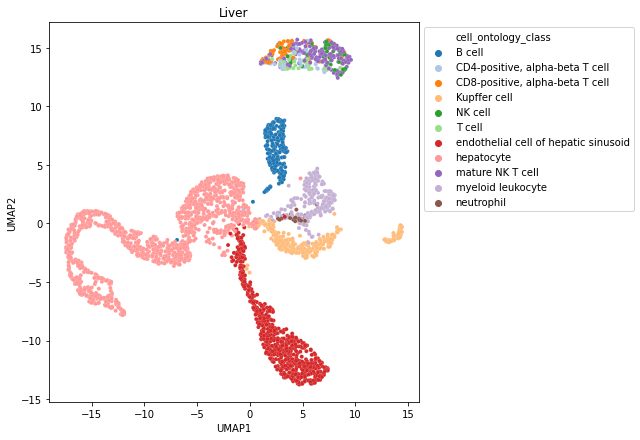

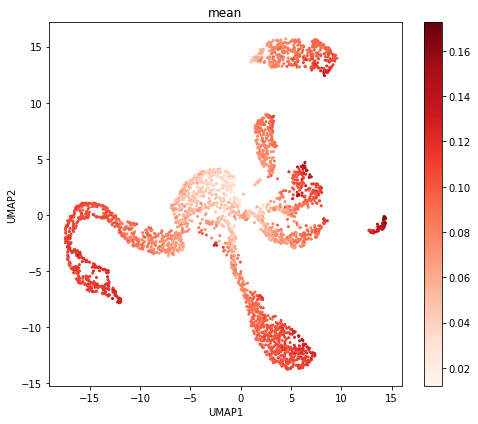

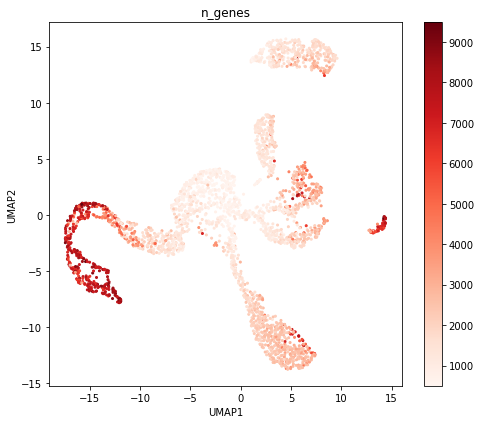

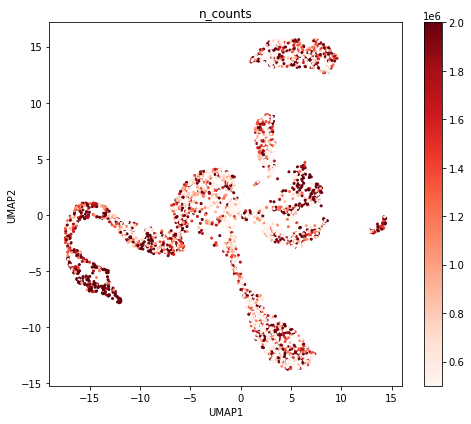

In [27]:
# Confounding factors? 
plot_list = [['Liver', 'mean'],
             ['Liver', 'n_genes'],
             ['Liver', 'n_counts']]

term_list = [x[1] for x in plot_list]
df_term = data_facs_ct.obs[term_list].copy()

tissue_plot = []
for tissue,term in plot_list:
    
    df_plot = pd.DataFrame(index=dic_data_facs[tissue].obs.index)
    df_plot['UMAP1'] = dic_data_facs[tissue].obsm['X_umap'][:,0]
    df_plot['UMAP2'] = dic_data_facs[tissue].obsm['X_umap'][:,1]
    df_plot['cell_ontology_class'] = dic_data_facs[tissue].obs['cell_ontology_class']
    df_plot[term] = df_term.loc[df_plot.index, term]
    
    temp_df = df_plot.groupby('cell_ontology_class').agg({'UMAP1':len})
    celltype_list = list(temp_df.index[temp_df['UMAP1']>25])
    celltype_list.sort()
    celltype_set = set(celltype_list)
    df_plot = df_plot.loc[[x in celltype_set for x in df_plot['cell_ontology_class']]]
    
    if len(celltype_list)<=10:
        palette='tab10'
    else:
        palette='tab20'
    
    if tissue not in tissue_plot:
        tissue_plot.append(tissue)
        plt.figure(figsize=[9,6])
        sns.scatterplot(data=df_plot, x='UMAP1', y='UMAP2', 
                        hue='cell_ontology_class', hue_order=celltype_list, palette=palette,
                        s=16, linewidth=0.1)
        plt.legend(loc="upper left", bbox_to_anchor=(1,1))
        plt.tight_layout()
        plt.title(tissue)
        plt.show()
    
    plt.figure(figsize=[7,6])
    if term=='n_counts':
        plt.scatter(df_plot['UMAP1'], df_plot['UMAP2'], c=df_plot[term],
                    cmap='Reds', vmin=5e5,vmax=2e6, s=4)
    else:
        plt.scatter(df_plot['UMAP1'], df_plot['UMAP2'], c=df_plot[term],
                    cmap='Reds', s=4)
    plt.colorbar()
    plt.xlabel('UMAP1')
    plt.ylabel('UMAP2')
    plt.title('%s'%(term))
    plt.tight_layout()
    plt.show()

### Compare TRS and TRS gene sets 

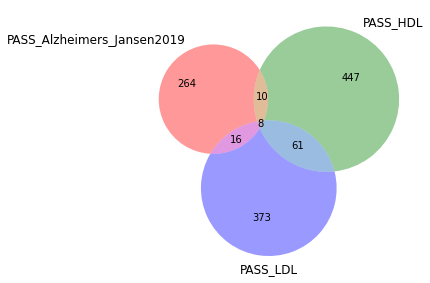

In [28]:
from matplotlib_venn import venn2
from matplotlib_venn import venn3

dic_trs_geneset = {}
for trait in trait_list:
    ind_select = (dic_geneset[trait]['fdr'].values<0.1)
    dic_trs_geneset[trait] = set(dic_geneset[trait].index[ind_select])

plot_list = ['PASS_Alzheimers_Jansen2019', 'PASS_HDL', 'PASS_LDL']
plt.figure(figsize=[5,5])
venn3([dic_trs_geneset[x] for x in plot_list], plot_list)
plt.show()

# plot_list = ['PASS_HDL', 'PASS_LDL', 'UKB_460K.biochemistry_LDLdirect']
# plt.figure(figsize=[5,5])
# venn3([dic_trs_geneset[x] for x in plot_list], plot_list)
# plt.show()

# plot_list = ['PASS_HDL', 'PASS_LDL', 'UKB_460K.biochemistry_HDLcholesterol']
# plt.figure(figsize=[5,5])
# venn3([dic_trs_geneset[x] for x in plot_list], plot_list)
# plt.show()

# plot_list = ['PASS_Alzheimers_Jansen2019', 'UKB_460K.biochemistry_HDLcholesterol', 'UKB_460K.biochemistry_LDLdirect']
# plt.figure(figsize=[5,5])
# venn3([dic_trs_geneset[x] for x in plot_list], plot_list)
# plt.show()

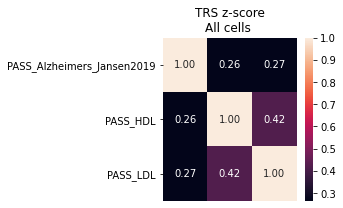

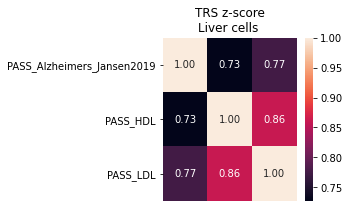

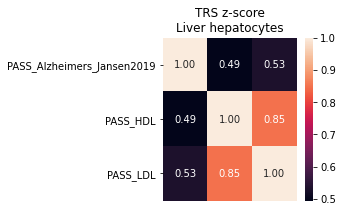

In [29]:
trait_analysis_list = ['PASS_Alzheimers_Jansen2019', 'PASS_HDL', 'PASS_LDL']
# 
df_plot = pd.DataFrame()
for trait in trait_analysis_list:
    df_plot[trait] = dic_trs['%s;trs_ez'%(trait)]
    
df_plot = df_plot.corr()
plt.figure(figsize=[3,3])
sns.heatmap(df_plot, annot=df_plot, fmt='0.2f', xticklabels=False)
plt.title('TRS z-score\nAll cells ')
plt.show()

# 
ind_select = (data_facs_ct.obs['tissue']=='Liver')
df_plot = pd.DataFrame()
for trait in trait_analysis_list:
    df_plot[trait] = dic_trs['%s;trs_ez'%(trait)][ind_select]
    
df_plot = df_plot.corr()
plt.figure(figsize=[3,3])
sns.heatmap(df_plot, annot=df_plot, fmt='0.2f', xticklabels=False)
plt.title('TRS z-score\nLiver cells ')
plt.show()

# 
ind_select = (data_facs_ct.obs['tissue']=='Liver')&(data_facs_ct.obs['cell_ontology_class']=='hepatocyte')
df_plot = pd.DataFrame()
for trait in trait_analysis_list:
    df_plot[trait] = dic_trs['%s;trs_ez'%(trait)][ind_select]
    
df_plot = df_plot.corr()
plt.figure(figsize=[3,3])
sns.heatmap(df_plot, annot=df_plot, fmt='0.2f', xticklabels=False)
plt.title('TRS z-score\nLiver hepatocytes')
plt.show()

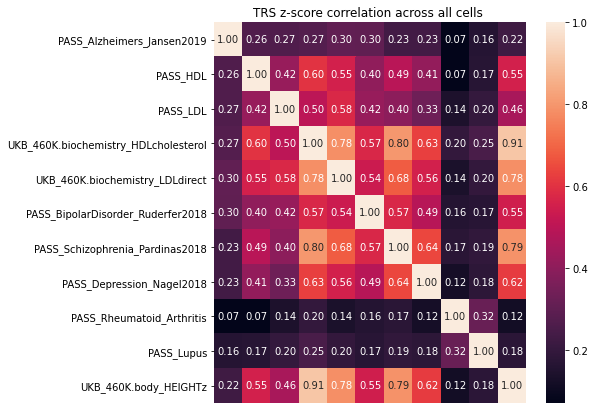

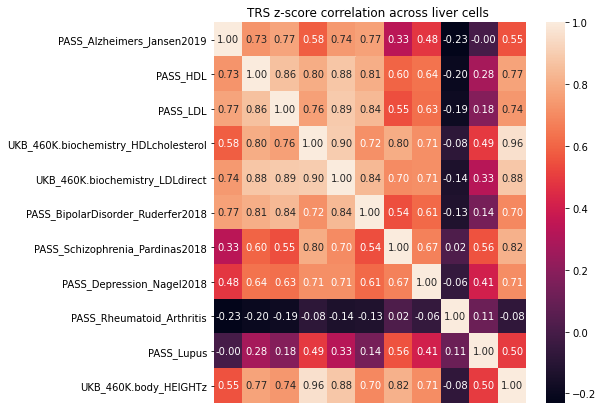

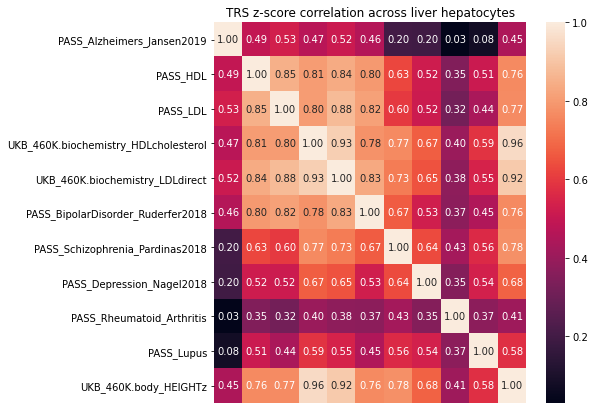

In [32]:
trait_analysis_list = trait_list
# 
df_plot = pd.DataFrame()
for trait in trait_analysis_list:
    df_plot[trait] = dic_trs['%s;trs_ez'%(trait)]
    
df_plot = df_plot.corr()
plt.figure(figsize=[7,7])
sns.heatmap(df_plot, annot=df_plot, fmt='0.2f', xticklabels=False)
plt.title('TRS z-score correlation across all cells ')
plt.show()

# 
ind_select = (data_facs_ct.obs['tissue']=='Liver')
df_plot = pd.DataFrame()
for trait in trait_analysis_list:
    df_plot[trait] = dic_trs['%s;trs_ez'%(trait)][ind_select]
    
df_plot = df_plot.corr()
plt.figure(figsize=[7,7])
sns.heatmap(df_plot, annot=df_plot, fmt='0.2f', xticklabels=False)
plt.title('TRS z-score correlation across liver cells ')
plt.show()

# 
ind_select = (data_facs_ct.obs['tissue']=='Liver')&(data_facs_ct.obs['cell_ontology_class']=='hepatocyte')
df_plot = pd.DataFrame()
for trait in trait_analysis_list:
    df_plot[trait] = dic_trs['%s;trs_ez'%(trait)][ind_select]
    
df_plot = df_plot.corr()
plt.figure(figsize=[7,7])
sns.heatmap(df_plot, annot=df_plot, fmt='0.2f', xticklabels=False)
plt.title('TRS z-score correlation across liver hepatocytes')
plt.show()

### Liver hepatocyte marker genes 

In [101]:
# Liver hepatocyte markers 

tms_gene_set = set(data_facs_ct.var_names)

# PanglaoDB_Franzen_Database_2019
df_pl = pd.read_csv(DATA_PATH+'/celltype_marker/PanglaoDB_Franzen_Database_2019/PanglaoDB_markers_27_Mar_2020.tsv',
                    sep='\t')
ind_select = (df_pl['cell type']=='Hepatocytes') & (df_pl['species'].isin(['Mm', 'Mm Hs'])) &\
                 (df_pl['canonical marker']==1) & (df_pl['specificity_mouse']>0.01) & (df_pl['sensitivity_mouse']>0.01)
hep_marker_pl = list(df_pl.loc[ind_select]['official gene symbol'].values)
hep_marker_pl = [dic_mapping[x] for x in hep_marker_pl if (x in dic_mapping.keys())]
hep_marker_pl = [x for x in hep_marker_pl if x in tms_gene_set]

# CellMarker_Zhang_NAR_2019
df_cm = pd.read_csv(DATA_PATH+'/celltype_marker/CellMarker_Zhang_NAR_2019/Mouse_cell_markers.txt', sep='\t')
ind_select = (df_cm['cellName']=='Hepatocyte') 
hep_marker_cm = []
for list_ in df_cm.loc[ind_select, 'geneSymbol']:
    hep_marker_cm += list_.split(',')
hep_marker_cm = [x.strip() for x in hep_marker_cm]
hep_marker_cm = [x for x in hep_marker_cm if x in tms_gene_set]

hep_marker = list(set(hep_marker_pl + hep_marker_cm))
hep_marker.sort()

print('# PanglaoDB hepatocyte markers: %d'%(len(hep_marker_pl)))
print('# CellMarker hepatocyte markers: %d'%(len(hep_marker_cm)))
print('# Intersection: %d'%(len(set(hep_marker_pl) & set(hep_marker_cm))))

# PanglaoDB hepatocyte markers: 28
# CellMarker hepatocyte markers: 14
# Intersection: 5


In [98]:
df_gene_corr.loc[hep_marker_cm]

,PASS_Alzheimers_Jansen2019.Pearson,PASS_HDL.Pearson,PASS_LDL.Pearson,UKB_460K.biochemistry_HDLcholesterol.Pearson,UKB_460K.biochemistry_LDLdirect.Pearson,PASS_BipolarDisorder_Ruderfer2018.Pearson,PASS_Schizophrenia_Pardinas2018.Pearson,PASS_Depression_Nagel2018.Pearson,PASS_Rheumatoid_Arthritis.Pearson,PASS_Lupus.Pearson,UKB_460K.body_HEIGHTz.Pearson
index,,,,,,,,,,,
Krt18,0.132449,0.099012,0.136043,0.243410,0.218051,0.076509,0.178170,0.212611,0.035443,0.119104,0.252983
Afp,0.003187,-0.004134,0.000670,0.008549,-0.004608,-0.009542,-0.014017,-0.028695,0.056515,-0.012299,0.010847
Afp,0.003187,-0.004134,0.000670,0.008549,-0.004608,-0.009542,-0.014017,-0.028695,0.056515,-0.012299,0.010847
Acly,0.067290,0.378648,0.364579,0.465731,0.435958,0.389139,0.472886,0.401176,0.368216,0.348827,0.457576
Alb,0.355604,0.655668,0.602809,0.551112,0.602166,0.671738,0.416628,0.285558,0.323114,0.340290,0.533599
Apoa1,0.449051,0.457080,0.448422,0.365072,0.394402,0.437500,0.079726,0.170573,0.049774,0.120868,0.313079
Asl,0.231336,0.309625,0.337432,0.429533,0.401022,0.293123,0.419898,0.458079,0.201820,0.267798,0.423298
Ass1,0.003058,0.095979,0.023023,0.254092,0.161659,-0.041604,0.229705,0.334300,0.166747,0.217530,0.261505
Cyp2e1,0.280615,0.138208,0.188639,0.020878,0.123139,0.126009,-0.109134,-0.114485,-0.075317,-0.060332,0.039051


In [100]:
df_gene_corr.loc[hep_marker_pl]

,PASS_Alzheimers_Jansen2019.Pearson,PASS_HDL.Pearson,PASS_LDL.Pearson,UKB_460K.biochemistry_HDLcholesterol.Pearson,UKB_460K.biochemistry_LDLdirect.Pearson,PASS_BipolarDisorder_Ruderfer2018.Pearson,PASS_Schizophrenia_Pardinas2018.Pearson,PASS_Depression_Nagel2018.Pearson,PASS_Rheumatoid_Arthritis.Pearson,PASS_Lupus.Pearson,UKB_460K.body_HEIGHTz.Pearson
index,,,,,,,,,,,
Hnf4a,0.218459,0.317525,0.324911,0.355349,0.377503,0.348482,0.328539,0.275962,0.103391,0.161209,0.344405
Prox1,0.028658,0.125361,0.133906,0.207693,0.207156,0.187423,0.200470,0.169669,0.109378,0.085080,0.190948
Cdh1,-0.010078,0.133215,0.137008,0.236949,0.210214,0.226097,0.268285,0.182855,0.180870,0.142193,0.237846
Gpc3,-0.019984,0.014256,-0.021600,-0.006740,-0.018327,-0.060090,-0.024715,-0.068442,0.016362,0.006768,-0.010113
Cps1,0.242370,0.561353,0.557326,0.616049,0.626875,0.614398,0.561731,0.440388,0.404071,0.401948,0.590820
Ctnnb1,0.052242,0.228358,0.251210,0.326028,0.330212,0.276693,0.336856,0.235496,0.217455,0.251651,0.341329
Apob,0.069900,0.616753,0.600413,0.523602,0.576182,0.620390,0.501119,0.378447,0.353425,0.422198,0.493725
Apoa1,0.449051,0.457080,0.448422,0.365072,0.394402,0.437500,0.079726,0.170573,0.049774,0.120868,0.313079
Apoc3,0.550401,0.256182,0.281318,0.168020,0.213916,0.244282,-0.032430,0.015147,-0.170452,-0.062920,0.114270


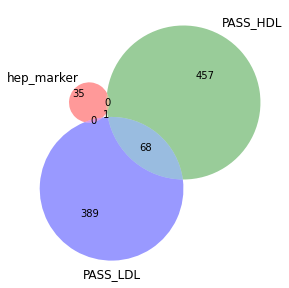

In [102]:
from matplotlib_venn import venn2
from matplotlib_venn import venn3

dic_trs_geneset = {}
for trait in trait_list:
    ind_select = (dic_geneset[trait]['fdr'].values<0.1)
    dic_trs_geneset[trait] = set(dic_geneset[trait].index[ind_select])
    
dic_trs_geneset['hep_marker'] = set(hep_marker)

plot_list = ['hep_marker', 'PASS_HDL', 'PASS_LDL']
plt.figure(figsize=[5,5])
venn3([dic_trs_geneset[x] for x in plot_list], plot_list)
plt.show()

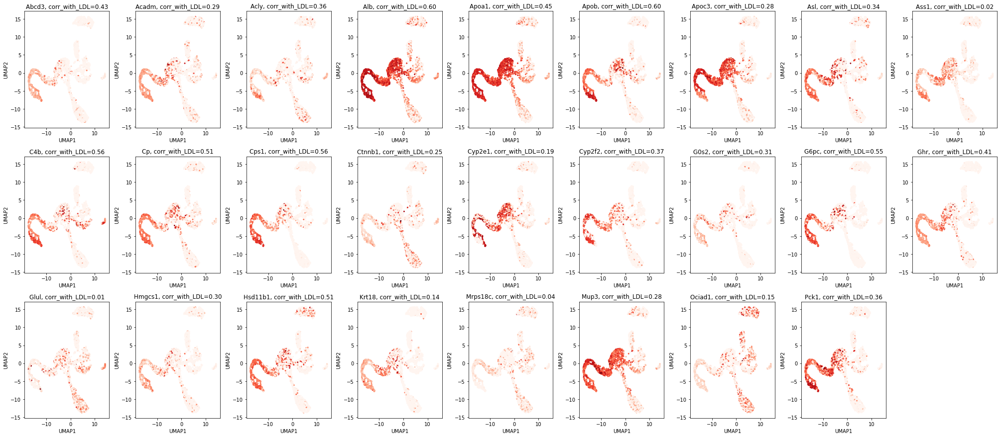

In [115]:
# Visualize top genes 
    
trait='PASS_LDL'

ind_select = (data_facs_ct.obs['tissue']=='Liver')
anndata_tissue = data_facs_ct[ind_select,:].copy()

temp_df = pd.DataFrame(index=anndata_tissue.obs.index,
                       columns=hep_marker,
                       data=anndata_tissue[:,hep_marker].X.toarray())

df_plot = pd.DataFrame(index=dic_data_facs[tissue].obs.index)
df_plot['UMAP1'] = dic_data_facs[tissue].obsm['X_umap'][:,0]
df_plot['UMAP2'] = dic_data_facs[tissue].obsm['X_umap'][:,1]
df_plot = df_plot.join(temp_df)

# Only look at high
for gene in hep_marker:
    if df_plot[gene].values.mean()<0.2:
        df_plot.drop(labels=gene, axis=1, inplace=True)
gene_list = [x for x in df_plot.columns if 'UMAP' not in x]
gene_list.sort()

# Positively correlated genes 
plt.figure(figsize=[28,20])
for i_gene,gene in enumerate(gene_list):
    plt.subplot(int(len(gene_list)/6+1), 9, i_gene+1)
    plt.scatter(df_plot['UMAP1'], df_plot['UMAP2'], c=df_plot[gene],
                cmap='Reds', vmin=0, s=4)
    plt.xlabel('UMAP1')
    plt.ylabel('UMAP2')
    plt.title('%s, corr_with_LDL=%0.2f'%(gene, df_gene_corr.loc[gene,'%s.Pearson'%trait]))
plt.tight_layout()
plt.show()

### If the intersection of LDL and HDL is driving the pattern 

In [117]:
dic_trs_geneset = {}
for trait in trait_list:
    ind_select = (dic_geneset[trait]['fdr'].values<0.1)
    dic_trs_geneset[trait] = set(dic_geneset[trait].index[ind_select])
dic_trs_geneset['LDL_HDL_shared'] = dic_trs_geneset['PASS_HDL'] & dic_trs_geneset['PASS_LDL']
dic_trs_geneset['LDL_only'] = dic_trs_geneset['PASS_LDL'] - dic_trs_geneset['PASS_HDL']
dic_trs_geneset['HDL_only'] = dic_trs_geneset['PASS_HDL'] - dic_trs_geneset['PASS_LDL']

In [118]:
# Obtain TRS
start_time = time.time()
dic_trs_other = {}
for trait in ['LDL_HDL_shared', 'LDL_only', 'HDL_only']:
    
    gene_list = list(dic_trs_geneset[trait])
    
    md.score_cell(data_facs_ct, gene_list, suffix='',
                  ctrl_opt='mean_match', trs_opt='vst', bc_opt='empi',
                  n_ctrl=10, n_genebin=200,
                  return_list=['trs_z', 'trs_tp', 'trs_ep', 'trs_ez'], verbose=False)
    
    dic_trs_other['%s;trs_tp'%(trait)] = data_facs_ct.obs['trs_tp'].values.copy()
    dic_trs_other['%s;trs_z'%(trait)] = data_facs_ct.obs['trs_z'].values.copy()
    dic_trs_other['%s;trs_ep'%(trait)] = data_facs_ct.obs['trs_ep'].values.copy()
    dic_trs_other['%s;trs_ez'%(trait)] = data_facs_ct.obs['trs_ez'].values.copy()
    print('#%-40s time=%0.1fs'%(trait,time.time()-start_time))

#LDL_HDL_shared                           time=8.5s
#LDL_only                                 time=19.6s
#HDL_only                                 time=30.5s


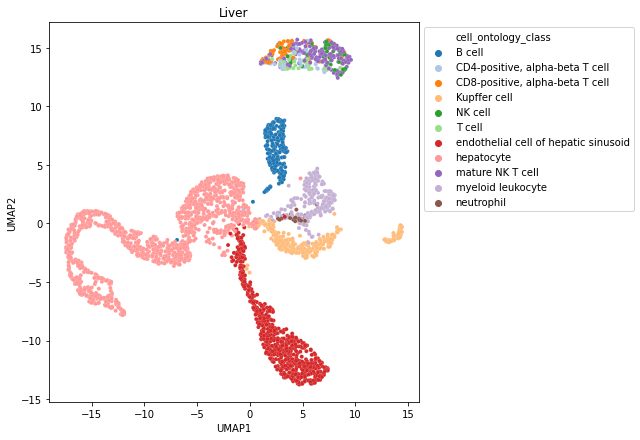

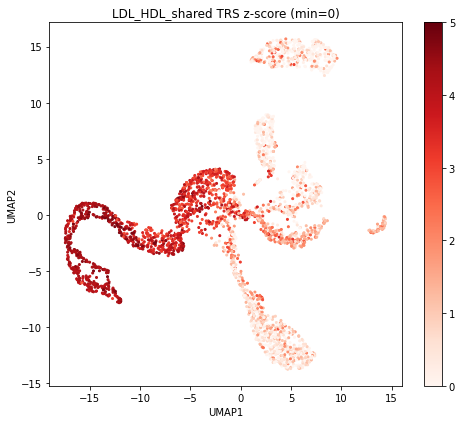

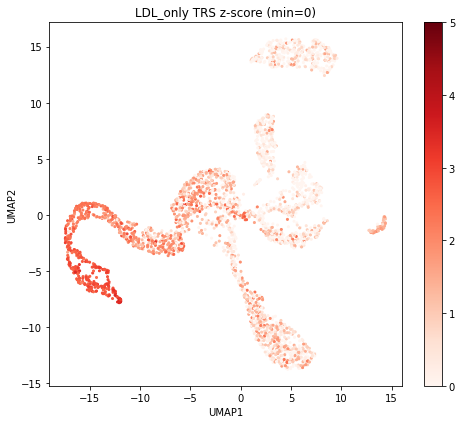

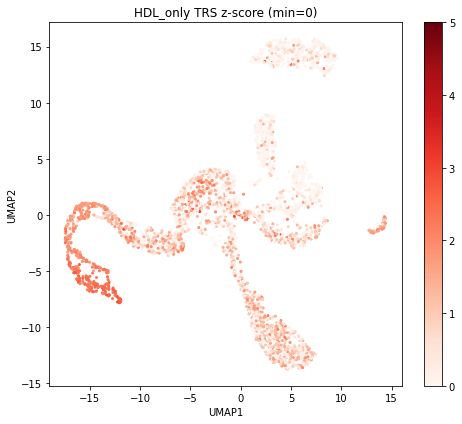

In [119]:
plot_list = [['Liver', 'LDL_HDL_shared'],
             ['Liver', 'LDL_only'],
             ['Liver', 'HDL_only']]

tissue_plot = []
for tissue,trait in plot_list:
    
    temp_df = pd.DataFrame(index=data_facs_ct.obs.index)
    temp_df['trs_ep'] = data=dic_trs_other['%s;trs_ep'%(trait)]
    temp_df['trs_ez'] = data=dic_trs_other['%s;trs_ez'%(trait)]
    
    df_plot = pd.DataFrame(index=dic_data_facs[tissue].obs.index)
    df_plot['UMAP1'] = dic_data_facs[tissue].obsm['X_umap'][:,0]
    df_plot['UMAP2'] = dic_data_facs[tissue].obsm['X_umap'][:,1]
    df_plot['cell_ontology_class'] = dic_data_facs[tissue].obs['cell_ontology_class']
    
    df_plot['trs_ez'] = temp_df.loc[df_plot.index, 'trs_ez']
    df_plot['trs_ep'] = temp_df.loc[df_plot.index, 'trs_ep']
    df_plot['trs_nlog10p'] = -np.log10(df_plot['trs_ep'])
    
    temp_df = df_plot.groupby('cell_ontology_class').agg({'trs_ez':len})
    celltype_list = list(temp_df.index[temp_df['trs_ez']>25])
    celltype_list.sort()
    celltype_set = set(celltype_list)
    df_plot = df_plot.loc[[x in celltype_set for x in df_plot['cell_ontology_class']]]
    
    if len(celltype_list)<=10:
        palette='tab10'
    else:
        palette='tab20'
    
    if tissue not in tissue_plot:
        tissue_plot.append(tissue)
        plt.figure(figsize=[9,6])
        sns.scatterplot(data=df_plot, x='UMAP1', y='UMAP2', 
                        hue='cell_ontology_class', hue_order=celltype_list, palette=palette,
                        s=16, linewidth=0.1)
        plt.legend(loc="upper left", bbox_to_anchor=(1,1))
        plt.tight_layout()
        plt.title(tissue)
        plt.show()
    
    plt.figure(figsize=[7,6])
#     plt.scatter(df_plot['UMAP1'], df_plot['UMAP2'], c=df_plot['trs_ez'],
#                 cmap='Reds', vmin=0-3, vmax=6, s=4)
    plt.scatter(df_plot['UMAP1'], df_plot['UMAP2'], c=df_plot['trs_ez'],
                cmap='Reds', vmin=0, vmax=5, s=4)
    plt.colorbar()
    plt.xlabel('UMAP1')
    plt.ylabel('UMAP2')
#     plt.title('%s -log10(P)'%trait)
    plt.title('%s TRS z-score (min=0)'%trait)
    plt.tight_layout()
    plt.show()
    
#     break
    

### TRS-correlated genes

In [120]:
df_gene_corr = pd.DataFrame(index=data_facs_ct.var_names)
for trait in trait_list:
    print(trait)
    ind_select = (data_facs_ct.obs['tissue']=='Liver')&(data_facs_ct.obs['cell_ontology_class']=='hepatocyte')
    anndata_celltype = data_facs_ct[ind_select,:].copy()
    anndata_celltype.obs['trs_ez'] = dic_trs['%s;trs_ez'%(trait)][ind_select]
    md.rank_trs_genes(anndata_celltype, method='pearson_corr')
    df_gene_corr['%s.Pearson'%trait] = anndata_celltype.var[['trs_corr']].copy()
RESULT_PATH='/n/holystore01/LABS/price_lab/Users/mjzhang/scTRS_data/result'
df_gene_corr.to_csv(RESULT_PATH+'/gene_trs_corr_hepatocyte_100220', sep='\t')

PASS_Alzheimers_Jansen2019
PASS_HDL
PASS_LDL
UKB_460K.biochemistry_HDLcholesterol
UKB_460K.biochemistry_LDLdirect
PASS_BipolarDisorder_Ruderfer2018
PASS_Schizophrenia_Pardinas2018
PASS_Depression_Nagel2018
PASS_Rheumatoid_Arthritis
PASS_Lupus
UKB_460K.body_HEIGHTz


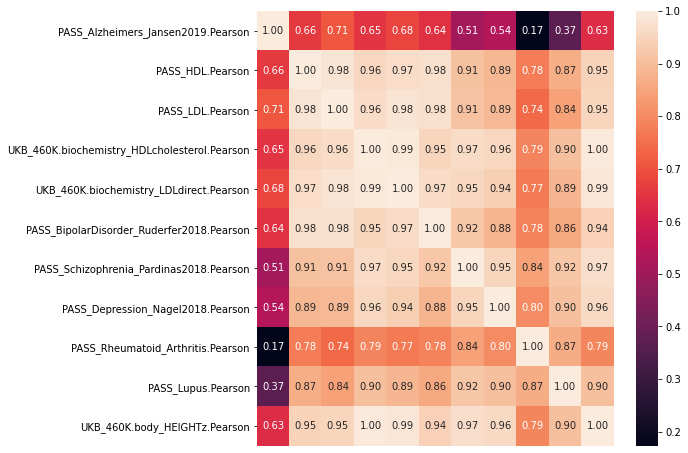

In [121]:
df_plot = df_gene_corr.corr()
plt.figure(figsize=[8,8])
sns.heatmap(df_plot, annot=df_plot, fmt='0.2f', xticklabels=False)
plt.show()

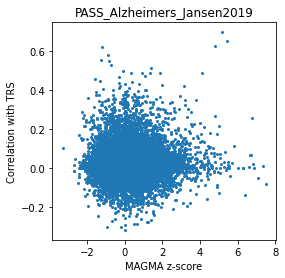

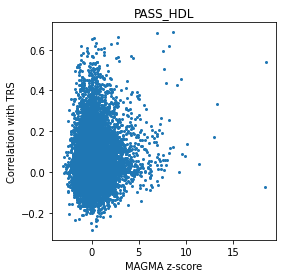

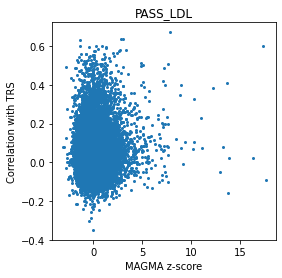

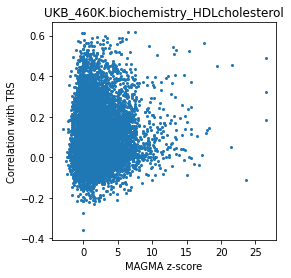

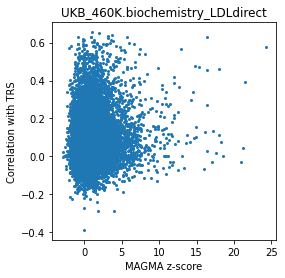

...

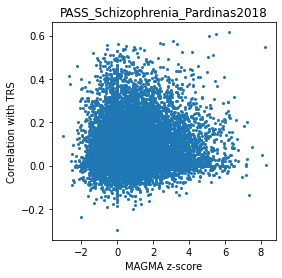

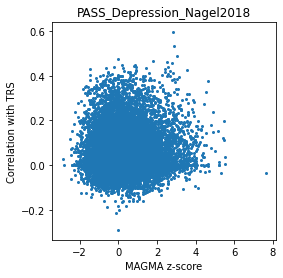

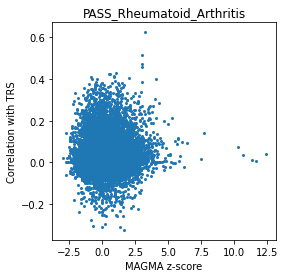

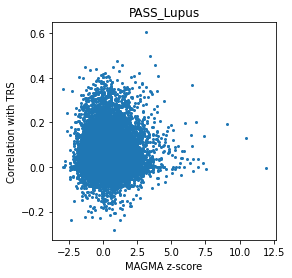

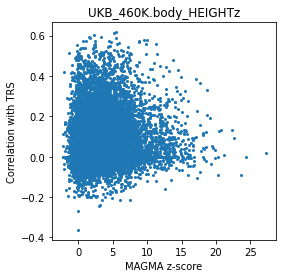

In [122]:
for trait in trait_list:
    df_plot = dic_geneset[trait].copy()
    df_plot = df_plot.join(df_gene_corr[['%s.Pearson'%trait]])
    
    plt.figure(figsize=[4,4])
    plt.scatter(df_plot['z_score'], df_plot[['%s.Pearson'%trait]], s=4)
    plt.xlabel('MAGMA z-score')
    plt.ylabel('Correlation with TRS')
    plt.title(trait)
    plt.show()

### Compare MAGMA genes and TRS-corr genes on a reference GWAS data

/n/home11/mjzhang/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: divide by zero encountered in log10


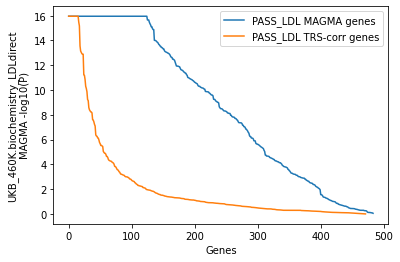

/n/home11/mjzhang/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: divide by zero encountered in log10


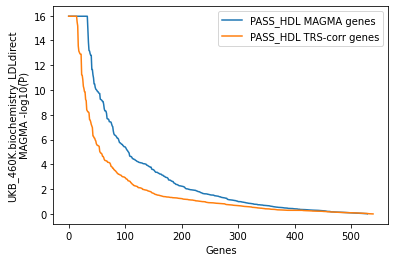

/n/home11/mjzhang/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: divide by zero encountered in log10


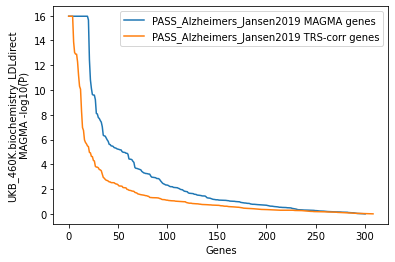

/n/home11/mjzhang/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: divide by zero encountered in log10


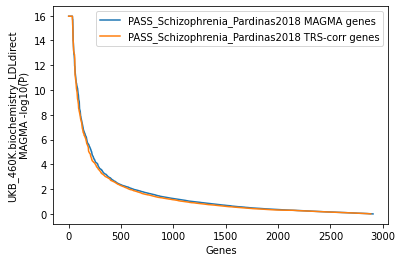

/n/home11/mjzhang/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: divide by zero encountered in log10


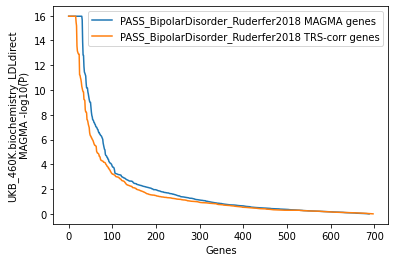

/n/home11/mjzhang/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: divide by zero encountered in log10


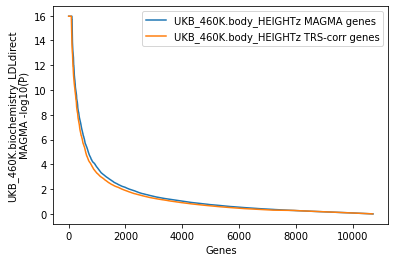

In [125]:
plot_list = [['PASS_LDL', 'UKB_460K.biochemistry_LDLdirect'],
             ['PASS_HDL', 'UKB_460K.biochemistry_LDLdirect'],
             ['PASS_Alzheimers_Jansen2019', 'UKB_460K.biochemistry_LDLdirect'],
             ['PASS_Schizophrenia_Pardinas2018', 'UKB_460K.biochemistry_LDLdirect'],
             ['PASS_BipolarDisorder_Ruderfer2018', 'UKB_460K.biochemistry_LDLdirect'],
             ['UKB_460K.body_HEIGHTz', 'UKB_460K.biochemistry_LDLdirect']]

for tar_trait,ref_trait in plot_list:
    # MAGMA geneset 
    ind_select = (dic_geneset[tar_trait]['fdr'].values<0.1)
    tar_magma_gene_list = list(set(dic_geneset[tar_trait].index[ind_select]))

    # TRS-correlated geneset
    overlap_gene_list = list(set(df_gene_corr.index)&set(dic_geneset[tar_trait].index))
    temp_df = df_gene_corr.loc[overlap_gene_list, ['%s.Pearson'%tar_trait]].copy()
    temp_df.sort_values(by='%s.Pearson'%tar_trait, inplace=True)
    tar_trscorr_gene_list =  list(temp_df.index[-len(tar_magma_gene_list):])

    plt.figure()

    temp_df = dic_geneset[ref_trait].copy()
    temp_df['nlog10p'] = -np.log10(temp_df['p_val'].values)
    temp_df.loc[np.isinf(temp_df['nlog10p'].values),'nlog10p'] = \
        temp_df.loc[~np.isinf(temp_df['nlog10p'].values),'nlog10p'].max()

    v_nlogp = temp_df.loc[tar_magma_gene_list,'nlog10p'].values
    v_nlogp = np.sort(v_nlogp)[::-1]
    plt.plot(np.arange(v_nlogp.shape[0]), v_nlogp, c='C0', label='%s MAGMA genes'%tar_trait)

    v_nlogp = temp_df.loc[tar_trscorr_gene_list,'nlog10p'].values
    v_nlogp = np.sort(v_nlogp)[::-1]
    plt.plot(np.arange(v_nlogp.shape[0]), v_nlogp, c='C1', label='%s TRS-corr genes'%tar_trait)

    plt.ylabel('%s\nMAGMA -log10(P)'%ref_trait)
    plt.xlabel('Genes')
    plt.legend()
    plt.show()

### Top correlated genes 

PASS_Alzheimers_Jansen2019
Positive corr.: Apoa2,Apoc4,Apoc1,Fabp1,Ttr,Rbp4,Apoc3,Dbi,Gm2083,Mgst1,Serpina1b,Ddt
3/12 in trait_gene_list: Apoc4,Apoc1,Apoa2
Negetive corr.: Cd24a,Tmsb4x,Gypa,Hbb-b1,Mrc1,Car2,Hba-a1,Igfbp7,Hbq1b,Slfn14-ps,F830002L21Rik,Rab3il1
0/12 in trait_gene_list: 


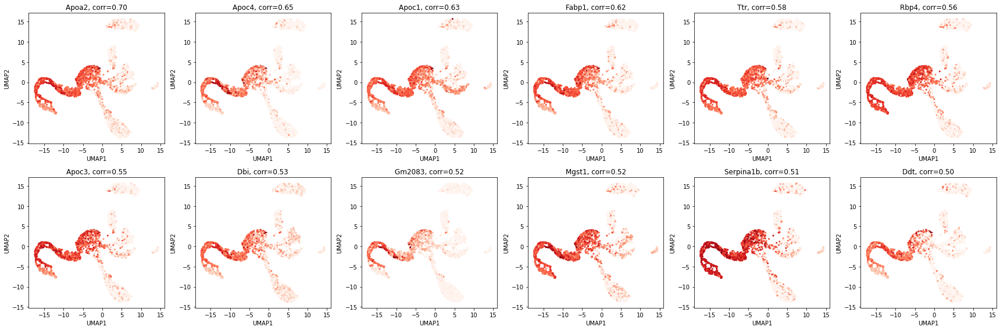

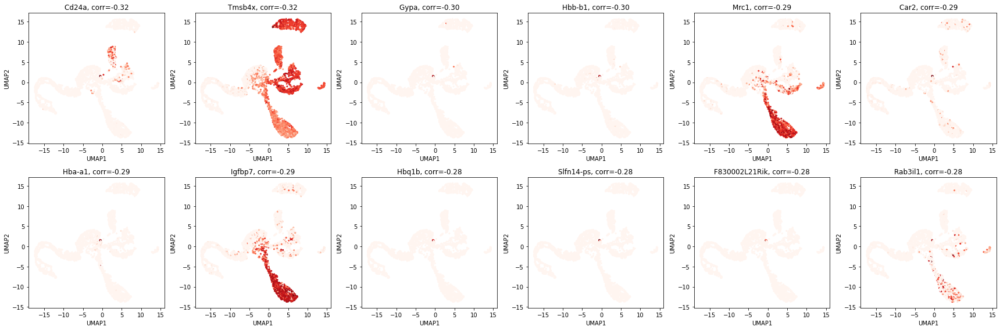

PASS_HDL
Positive corr.: Apoa5,F2,Itih4,Alb,Fga,Slc38a3,Gc,Plg,Pzp,Slc27a5,Serpinc1,Apob
5/12 in trait_gene_list: Apoa5,Itih4,F2,Apob,Slc38a3
Negetive corr.: Tmsb10,Tmsb4x,Igfbp7,1700011H14Rik,Rn45s,Saa2,Tinagl1,Cd24a,Dnase1l3,Sdpr,Kcnn4,Epcam
0/12 in trait_gene_list: 


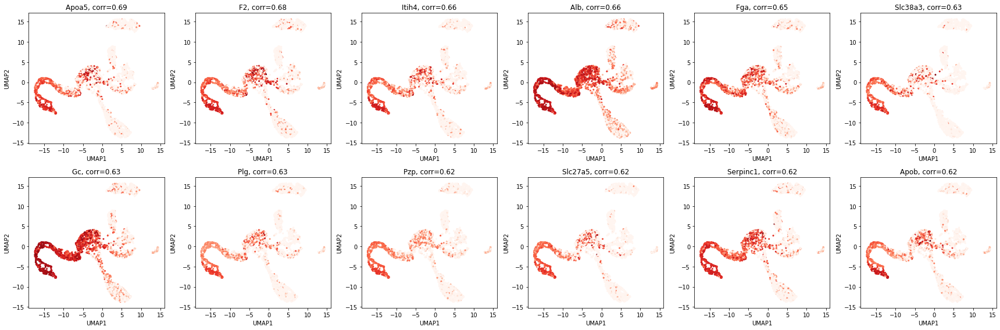

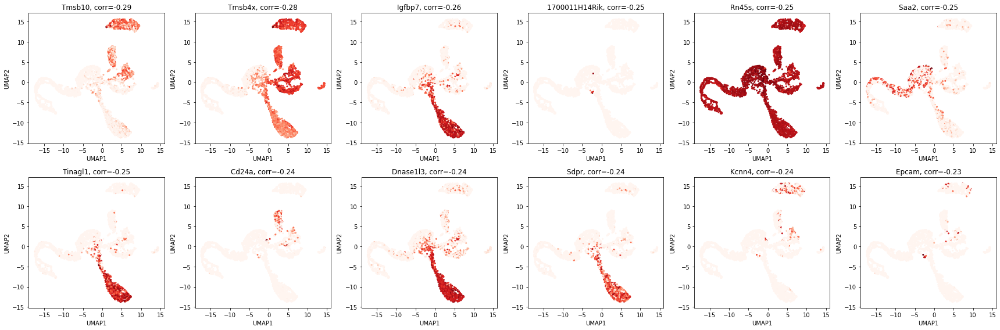

PASS_LDL
Positive corr.: Apoa5,Itih3,Itih1,Fga,Pzp,Cyp2d10,Gc,Alb,Slc38a3,Apob,Slc27a5,Plg
4/12 in trait_gene_list: Apob,Itih1,Apoa5,Itih3
Negetive corr.: Tmsb4x,Igfbp7,Tmsb10,Dnase1l3,Rn45s,Sdpr,Gpr182,Tinagl1,Ccnd2,Mrc1,1700011H14Rik,Sparc
0/12 in trait_gene_list: 


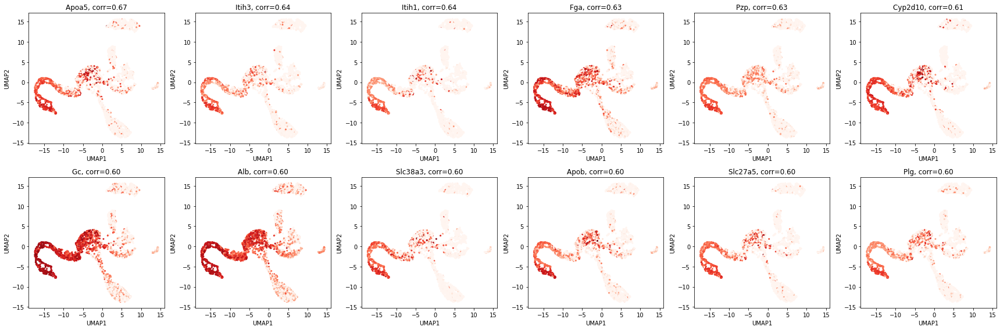

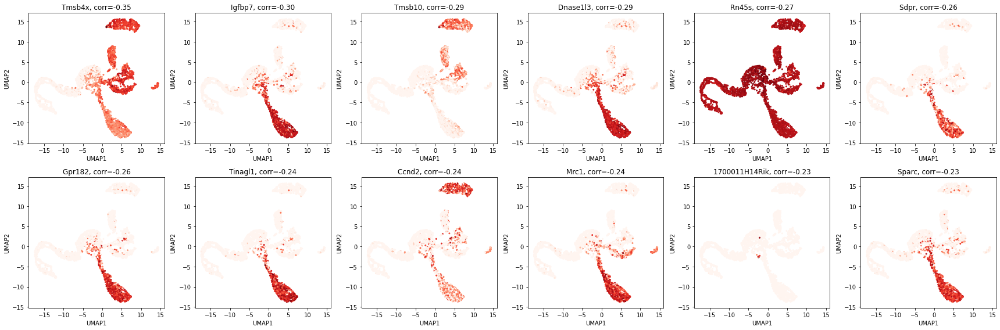

UKB_460K.biochemistry_HDLcholesterol
Positive corr.: Slc38a3,Cps1,Gc,Fga,Serpina1c,Pzp,Itih3,Itih1,Mug2,P4hb,Trf,F12
6/12 in trait_gene_list: Itih1,Cps1,Slc38a3,Trf,Itih3,F12
Negetive corr.: Tmsb4x,Mrc1,Rn45s,Lyz2,Tmsb10,Gm11428,C1qb,Fasl,Dcn,Xcl1,Txk,Igsf3
1/12 in trait_gene_list: Igsf3


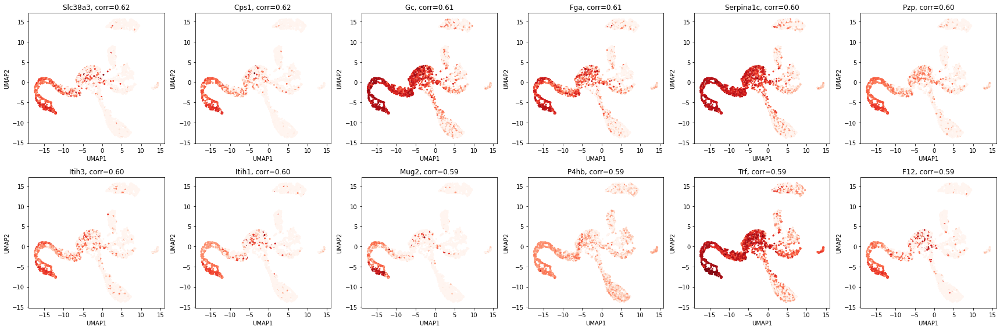

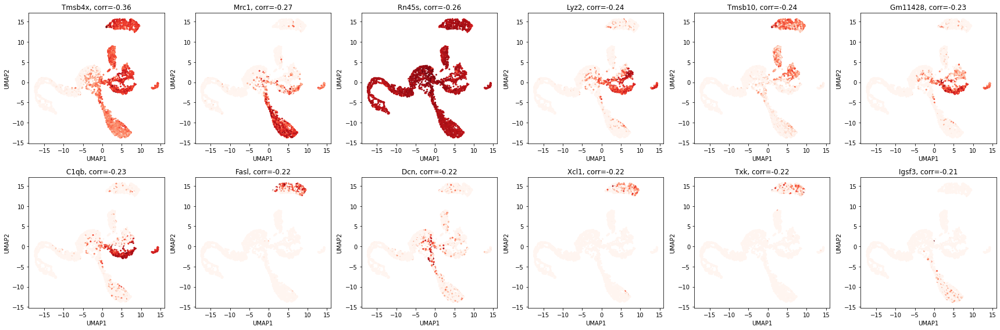

UKB_460K.biochemistry_LDLdirect
Positive corr.: Fga,Slc38a3,Pzp,Slc27a5,Itih1,Plg,Gc,Apoa5,P4hb,Cps1,Itih3,Cyp2d26
5/12 in trait_gene_list: Apoa5,Itih1,Slc27a5,Plg,Itih3
Negetive corr.: Tmsb4x,Rn45s,Dnase1l3,Igfbp7,Mrc1,Saa2,Tmsb10,Dcn,Saa1,Lyz2,Ccnd2,Tagln2
1/12 in trait_gene_list: Igfbp7


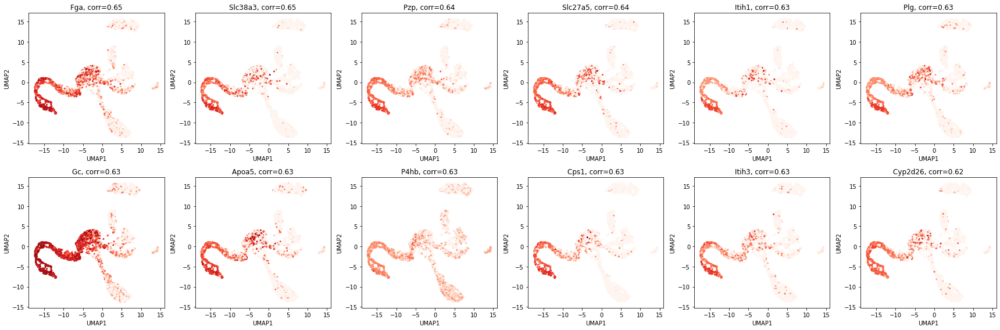

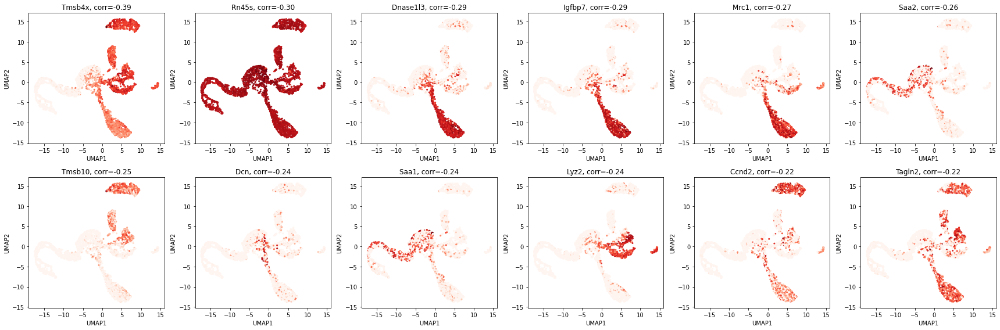

PASS_BipolarDisorder_Ruderfer2018
Positive corr.: Fga,Itih4,Slc27a5,Pzp,Fgg,Slc38a3,Alb,Itih1,Itih3,Apoh,Plg,Vtn
8/12 in trait_gene_list: Fga,Itih4,Itih1,Slc27a5,Apoh,Fgg,Itih3,Slc38a3
Negetive corr.: Tmsb4x,Igfbp7,Actb,Tmsb10,Dnase1l3,Rn45s,Ftl1,Anp32a,Ptma,Oaz1,Gm1821,Ubb
0/12 in trait_gene_list: 


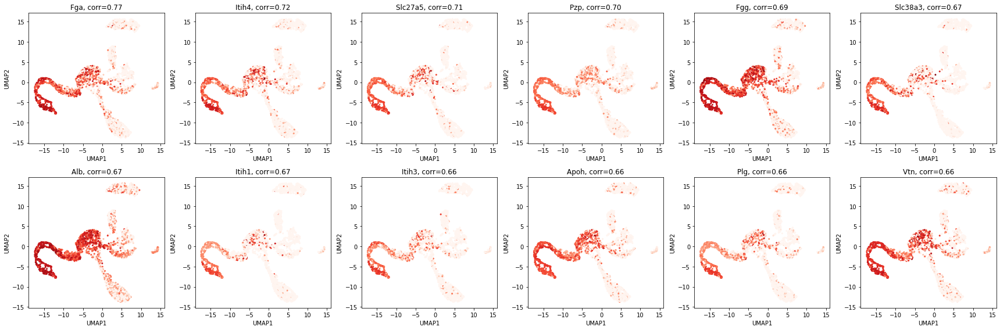

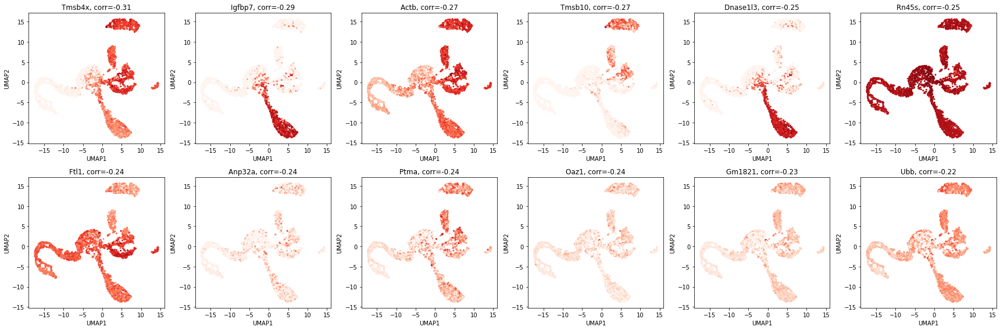

PASS_Schizophrenia_Pardinas2018
Positive corr.: Itih4,Itih3,Mug2,Itih1,Pzp,Pck1,Slc27a5,Pcx,Cps1,Dmgdh,Fga,Sardh
7/12 in trait_gene_list: Pck1,Itih1,Itih4,Slc27a5,Dmgdh,Pcx,Itih3
Negetive corr.: Tmsb4x,Apoc1,Ftl1,Lyz2,Gm11428,Sod1,Igfbp7,Ifi27l2a,C1qb,Dcn,Rn45s,Dnase1l3
0/12 in trait_gene_list: 


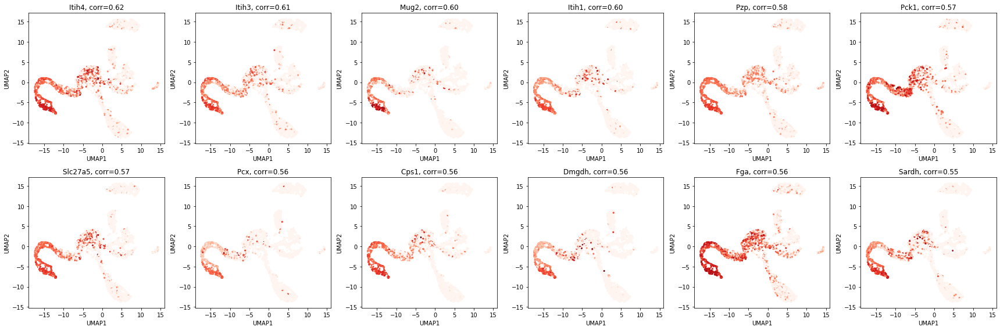

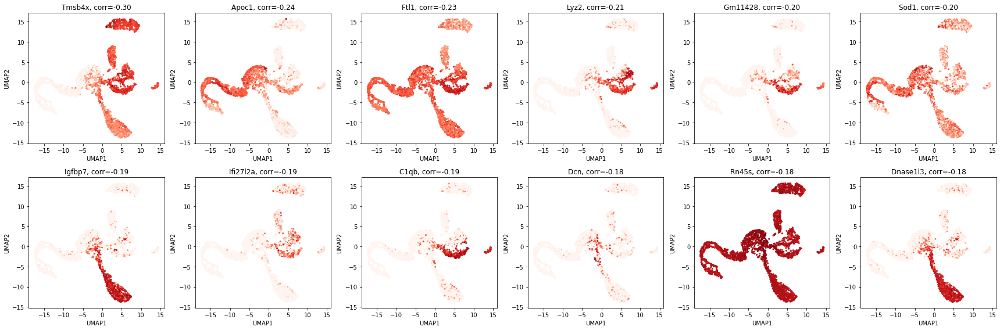

PASS_Depression_Nagel2018
Positive corr.: Agxt,Proz,F2,Pck1,Pcx,Mug2,Itih3,Asl,Mat1a,Sardh,Cbs,Cps1
4/12 in trait_gene_list: Proz,Asl,Agxt,F2
Negetive corr.: Tmsb4x,Igfbp7,Rps28,Gm11428,Rps29,Lyz2,Dnase1l3,Rpl41,Mrc1,Sparc,Rpl35,Ifi27l2a
0/12 in trait_gene_list: 


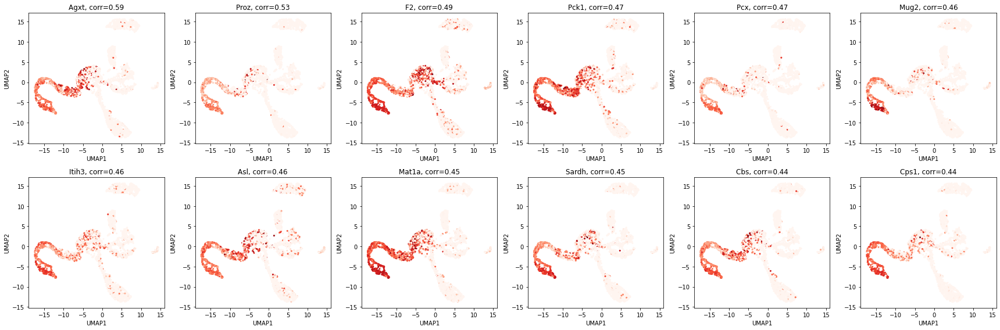

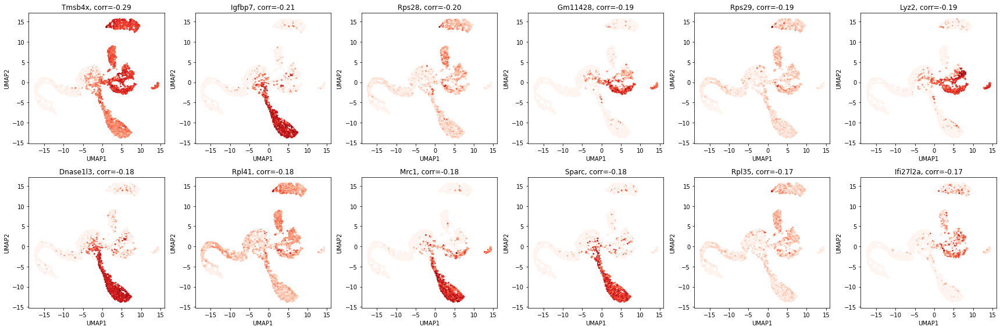

PASS_Rheumatoid_Arthritis
Positive corr.: Mat1a,Gldc,Pigr,Fads1,Mug2,Itih1,Dmgdh,Gpld1,Pcx,Cfb,Itih3,Fga
4/12 in trait_gene_list: Fads1,Mat1a,Gldc,Pigr
Negetive corr.: Mup7,Apoc1,Txn1,Ndufa4,Sod1,Atp5e,Mup14,Fabp1,Cycs,Dbi,Gm2083,Atp5j2
0/12 in trait_gene_list: 


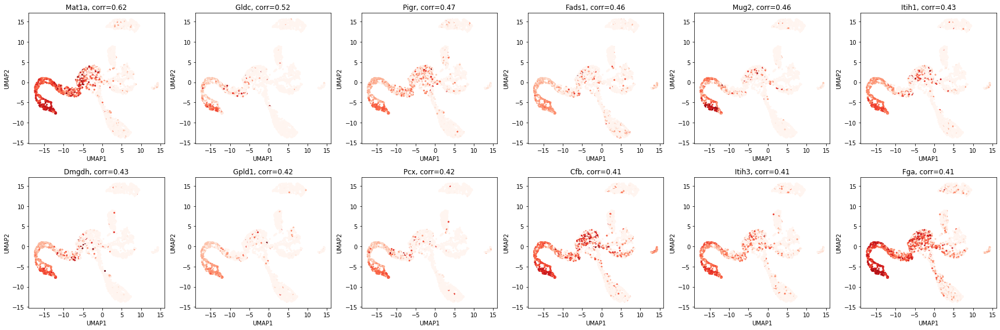

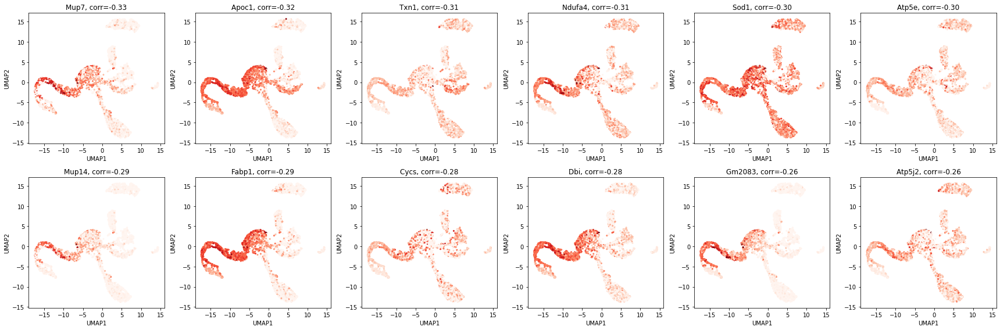

PASS_Lupus
Positive corr.: F2,Slc25a47,Trf,Cfb,Acox2,Sardh,Itih3,Pzp,F12,Itih4,Mug2,Itih1
3/12 in trait_gene_list: Acox2,F2,Slc25a47
Negetive corr.: Apoc1,Rpl41,Rps29,Fabp1,Uqcrq,Atp5l,Atp5e,Atp5k,Rpl35,1100001G20Rik,Saa2,Ndufa4
0/12 in trait_gene_list: 


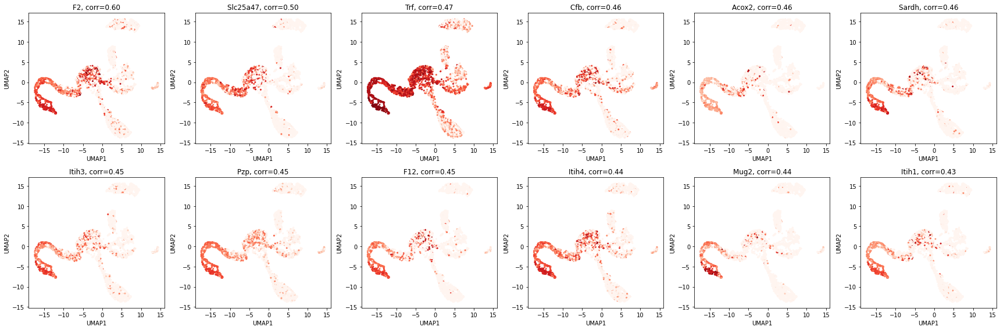

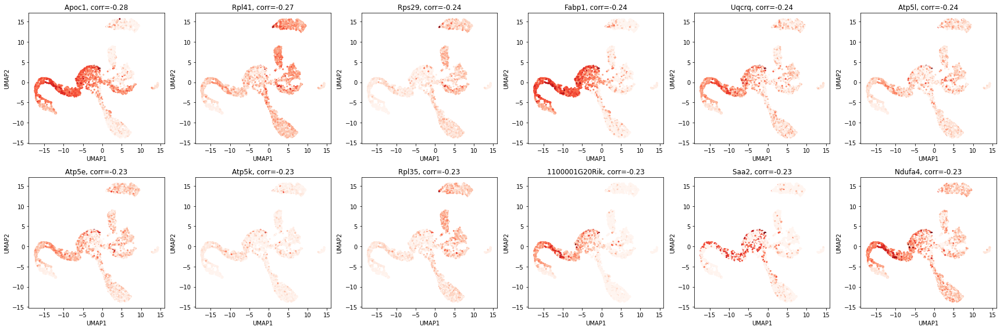

UKB_460K.body_HEIGHTz
Positive corr.: Fga,Gc,Slc38a3,Mat1a,Cps1,P4hb,Serpinc1,Serpina1c,Mug2,Itih3,Itih1,Pzp
9/12 in trait_gene_list: Serpinc1,Fga,Mat1a,Itih1,Cps1,P4hb,Gc,Itih3,Slc38a3
Negetive corr.: Tmsb4x,Mrc1,Rn45s,Saa2,Lyz2,C1qb,Dcn,Saa1,Gm11428,Ifi27l2a,Dnase1l3,Ecm1
4/12 in trait_gene_list: Dnase1l3,Dcn,Ecm1,C1qb


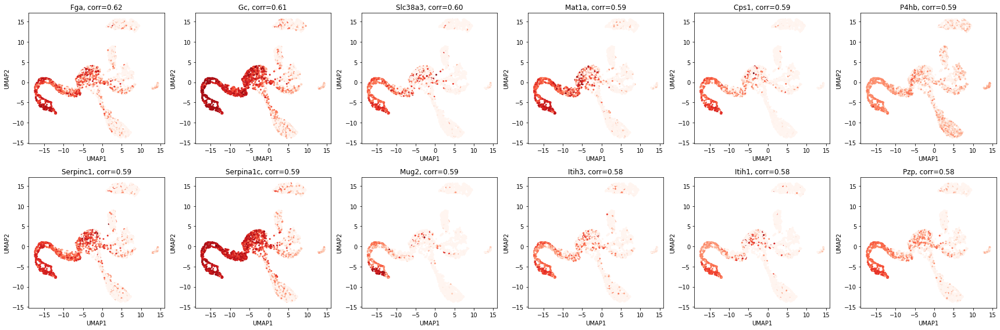

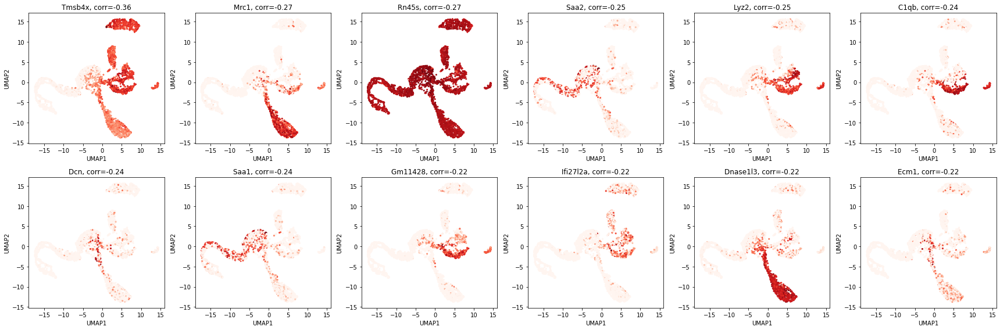

In [126]:
# Visualize top genes 
for trait in trait_list:
    
    print(trait)
    
    ind_select = (data_facs_ct.obs['tissue']=='Liver')
    anndata_tissue = data_facs_ct[ind_select,:].copy()
    
    temp_df = df_gene_corr[['%s.Pearson'%trait]].copy()
    temp_df.sort_values(by='%s.Pearson'%trait, inplace=True)
    gene_list_pos =  list(temp_df.index[-12:][::-1])
    gene_list_neg =  list(temp_df.index[0:12])
    gene_list = gene_list_pos+gene_list_neg
    
    temp_df = pd.DataFrame(index=anndata_tissue.obs.index,
                           columns=gene_list,
                           data=anndata_tissue[:,gene_list].X.toarray())
    
    df_plot = pd.DataFrame(index=dic_data_facs[tissue].obs.index)
    df_plot['UMAP1'] = dic_data_facs[tissue].obsm['X_umap'][:,0]
    df_plot['UMAP2'] = dic_data_facs[tissue].obsm['X_umap'][:,1]
    df_plot = df_plot.join(temp_df)
    
    ind_select = (dic_geneset[trait]['fdr'].values<0.1)
    trait_gene_list = dic_geneset[trait].index[ind_select]
    print('Positive corr.: %s'%','.join(gene_list_pos)) 
    print('%d/%d in trait_gene_list: %s'
          %(len(set(gene_list_pos)&set(trait_gene_list)), len(gene_list_pos),
            ','.join(set(gene_list_pos)&set(trait_gene_list))))
    print('Negetive corr.: %s'%','.join(gene_list_neg)) 
    print('%d/%d in trait_gene_list: %s'
          %(len(set(gene_list_neg)&set(trait_gene_list)), len(gene_list_neg),
            ','.join(set(gene_list_neg)&set(trait_gene_list))))
    
    # Positively correlated genes 
    for term,temp_list in [['positively', gene_list_pos], ['negatively', gene_list_neg]]:
        plt.figure(figsize=[24,8])
        for i_gene,gene in enumerate(temp_list):
            plt.subplot(2,int(len(gene_list_pos)/2), i_gene+1)
            plt.scatter(df_plot['UMAP1'], df_plot['UMAP2'], c=df_plot[gene],
                        cmap='Reds', vmin=0, s=4)
            plt.xlabel('UMAP1')
            plt.ylabel('UMAP2')
            plt.title('%s, corr=%0.2f'%(gene, df_gene_corr.loc[gene,'%s.Pearson'%trait]))
        plt.tight_layout()
        plt.show()

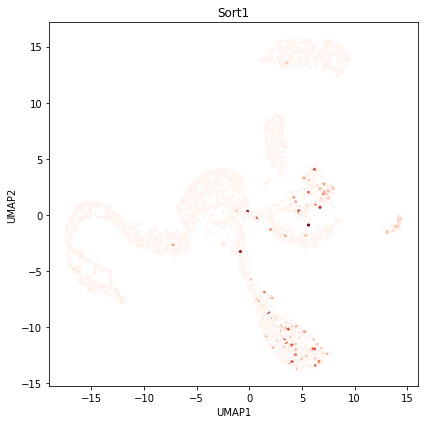

In [127]:
ind_select = (data_facs_ct.obs['tissue']=='Liver')
anndata_tissue = data_facs_ct[ind_select,:].copy()

gene_list = ['Sort1']
temp_df = pd.DataFrame(index=anndata_tissue.obs.index,
                       columns=gene_list,
                       data=anndata_tissue[:,gene_list].X.toarray())

df_plot = pd.DataFrame(index=dic_data_facs[tissue].obs.index)
df_plot['UMAP1'] = dic_data_facs[tissue].obsm['X_umap'][:,0]
df_plot['UMAP2'] = dic_data_facs[tissue].obsm['X_umap'][:,1]
df_plot = df_plot.join(temp_df)

# Positively correlated genes 
plt.figure(figsize=[6,6])
plt.scatter(df_plot['UMAP1'], df_plot['UMAP2'], c=df_plot[gene_list[0]],
            cmap='Reds', vmin=0, s=4)
plt.xlabel('UMAP1')
plt.ylabel('UMAP2')
plt.title('%s'%(gene_list[0]))
plt.tight_layout()
plt.show()

### Pathway analysis

In [129]:
from gprofiler import GProfiler
dic_pathway = {}
for trait in trait_list:
    
    ind_select = (dic_geneset[trait]['fdr'].values<0.1)
    trait_gene_list = dic_geneset[trait].index[ind_select]
    
    temp_df = df_gene_corr[['%s.Pearson'%trait]].copy()
    temp_df.sort_values(by='%s.Pearson'%trait, inplace=True)
    
    # Positive 
    gene_list = list(temp_df.index[-100:])
    
    gp = GProfiler(return_dataframe=True)
    df_pathway = gp.profile(organism='mmusculus', query=gene_list,
                         sources=['GO:BP', 'KEGG'], significance_threshold_method='fdr', 
                         user_threshold=0.01, background=list(data_facs_ct.var_names))
    dic_pathway['%s.pos'%trait] = df_pathway.copy()
    print('# %-30s pos. gene_list=%-4d    overlap with trait_geneset=%-3d/%3d'
          %(trait, len(gene_list), len(set(gene_list)&set(trait_gene_list)), len(trait_gene_list)))
    
#     # Negative 
#     gene_list = list(temp_df.index[:100])
    
#     gp = GProfiler(return_dataframe=True)
#     df_pathway = gp.profile(organism='mmusculus', query=gene_list,
#                          sources=['GO:BP', 'KEGG'], significance_threshold_method='fdr', 
#                          user_threshold=0.01, background=list(data_facs_ct.var_names))
#     dic_pathway['%s.neg'%trait] = df_pathway.copy()
    print('# %-30s neg. gene_list=%-4d    overlap with trait_geneset=%-3d/%3d'
          %(trait, len(gene_list), len(set(gene_list)&set(trait_gene_list)), len(trait_gene_list)))

# PASS_Alzheimers_Jansen2019     pos. gene_list=100     overlap with trait_geneset=8  /298
# PASS_Alzheimers_Jansen2019     neg. gene_list=100     overlap with trait_geneset=8  /298
# PASS_HDL                       pos. gene_list=100     overlap with trait_geneset=12 /527
# PASS_HDL                       neg. gene_list=100     overlap with trait_geneset=12 /527
# PASS_LDL                       pos. gene_list=100     overlap with trait_geneset=8  /460
# PASS_LDL                       neg. gene_list=100     overlap with trait_geneset=8  /460
# UKB_460K.biochemistry_HDLcholesterol pos. gene_list=100     overlap with trait_geneset=41 /6229
# UKB_460K.biochemistry_HDLcholesterol neg. gene_list=100     overlap with trait_geneset=41 /6229
# UKB_460K.biochemistry_LDLdirect pos. gene_list=100     overlap with trait_geneset=28 /3013
# UKB_460K.biochemistry_LDLdirect neg. gene_list=100     overlap with trait_geneset=28 /3013
# PASS_BipolarDisorder_Ruderfer2018 pos. gene_list=100     overlap with 

In [132]:
# Create a Pandas Excel writer using XlsxWriter as the engine.
writer = pd.ExcelWriter('./pathway_top100.xlsx', engine='xlsxwriter')
for term in dic_pathway.keys():
    temp_df = dic_pathway[term].copy()
    ind_select = (temp_df['term_size']<1000)&(temp_df['precision']>0.2)
    temp_df.loc[ind_select].to_excel(writer, sheet_name=term[:30])
writer.save()

In [113]:
temp_df = dic_pathway['PASS_Alzheimers_Jansen2019.pos'].copy()
ind_select = (temp_df['term_size']<1000)&(temp_df['precision']>0.2)
display(temp_df.loc[ind_select])

,source,native,name,p_value,significant,description,term_size,query_size,intersection_size,effective_domain_size,precision,recall,query,parents
0,KEGG,KEGG:00190,Oxidative phosphorylation,5.530208e-35,True,Oxidative phosphorylation,114,91,25,21956,0.274725,0.219298,query_1,[KEGG:00000]
1,KEGG,KEGG:04714,Thermogenesis,7.539625e-29,True,Thermogenesis,198,91,25,21956,0.274725,0.126263,query_1,[KEGG:00000]
4,KEGG,KEGG:05012,Parkinson disease,3.741605e-26,True,Parkinson disease,224,91,24,21956,0.263736,0.107143,query_1,[KEGG:00000]
5,KEGG,KEGG:04932,Non-alcoholic fatty liver disease (NAFLD),5.834682e-26,True,Non-alcoholic fatty liver disease (NAFLD),141,91,21,21956,0.230769,0.148936,query_1,[KEGG:00000]
9,GO:BP,GO:0006119,oxidative phosphorylation,2.343638e-18,True,"""The phosphorylation of ADP to ATP that accomp...",102,91,16,21956,0.175824,0.156863,query_1,"[GO:0006091, GO:0016310, GO:0046034]"
10,GO:BP,GO:0022900,electron transport chain,3.117819e-17,True,"""A process in which a series of electron carri...",121,91,16,21956,0.175824,0.132231,query_1,"[GO:0006091, GO:0055114]"
12,KEGG,KEGG:04260,Cardiac muscle contraction,1.141564e-16,True,Cardiac muscle contraction,79,91,13,21956,0.142857,0.164557,query_1,[KEGG:00000]


In [104]:
temp_df = dic_pathway['PASS_LDL.pos'].copy()
ind_select = (temp_df['term_size']<1000)&(temp_df['precision']>0.2)
display(temp_df.loc[ind_select])

,source,native,name,p_value,significant,description,term_size,query_size,intersection_size,effective_domain_size,precision,recall,query,parents
0,KEGG,KEGG:04610,Complement and coagulation cascades,5.424882e-09,True,Complement and coagulation cascades,88,20,6,21956,0.30,0.068182,query_1,[KEGG:00000]
1,GO:BP,GO:0010951,negative regulation of endopeptidase activity,2.221908e-08,True,"""Any process that decreases the frequency, rat...",249,20,8,21956,0.40,0.032129,query_1,"[GO:0010466, GO:0052548]"
2,GO:BP,GO:0010466,negative regulation of peptidase activity,2.221908e-08,True,"""Any process that stops or reduces the rate of...",264,20,8,21956,0.40,0.030303,query_1,"[GO:0045861, GO:0051346, GO:0052547]"
3,GO:BP,GO:0052547,regulation of peptidase activity,2.693965e-08,True,"""Any process that modulates the frequency, rat...",449,20,9,21956,0.45,0.020045,query_1,"[GO:0030162, GO:0051336]"
4,GO:BP,GO:0045861,negative regulation of proteolysis,1.220586e-07,True,"""Any process that stops, prevents, or reduces ...",357,20,8,21956,0.40,0.022409,query_1,"[GO:0006508, GO:0030162, GO:0032269]"
5,GO:BP,GO:0052548,regulation of endopeptidase activity,3.199730e-07,True,"""Any process that modulates the frequency, rat...",415,20,8,21956,0.40,0.019277,query_1,[GO:0052547]
6,GO:BP,GO:0051346,negative regulation of hydrolase activity,3.637608e-07,True,"""Any process that stops or reduces the rate of...",433,20,8,21956,0.40,0.018476,query_1,"[GO:0043086, GO:0051336]"
8,GO:BP,GO:0030162,regulation of proteolysis,7.096016e-07,True,"""Any process that modulates the frequency, rat...",728,20,9,21956,0.45,0.012363,query_1,"[GO:0006508, GO:0051246]"
10,GO:BP,GO:0043086,negative regulation of catalytic activity,1.759162e-05,True,"""Any process that stops or reduces the activit...",760,20,8,21956,0.40,0.010526,query_1,"[GO:0044092, GO:0050790]"
23,GO:BP,GO:0019752,carboxylic acid metabolic process,3.363071e-04,True,"""The chemical reactions and pathways involving...",874,20,7,21956,0.35,0.008009,query_1,[GO:0043436]


In [106]:
temp_df = dic_pathway['PASS_LDL.neg'].copy()
ind_select = (temp_df['term_size']<1000)&(temp_df['precision']>0.2)
display(temp_df.loc[ind_select])

,source,native,name,p_value,significant,description,term_size,query_size,intersection_size,effective_domain_size,precision,recall,query,parents


### Old code

/n/home11/mjzhang/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:16: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  app.launch_new_instance()


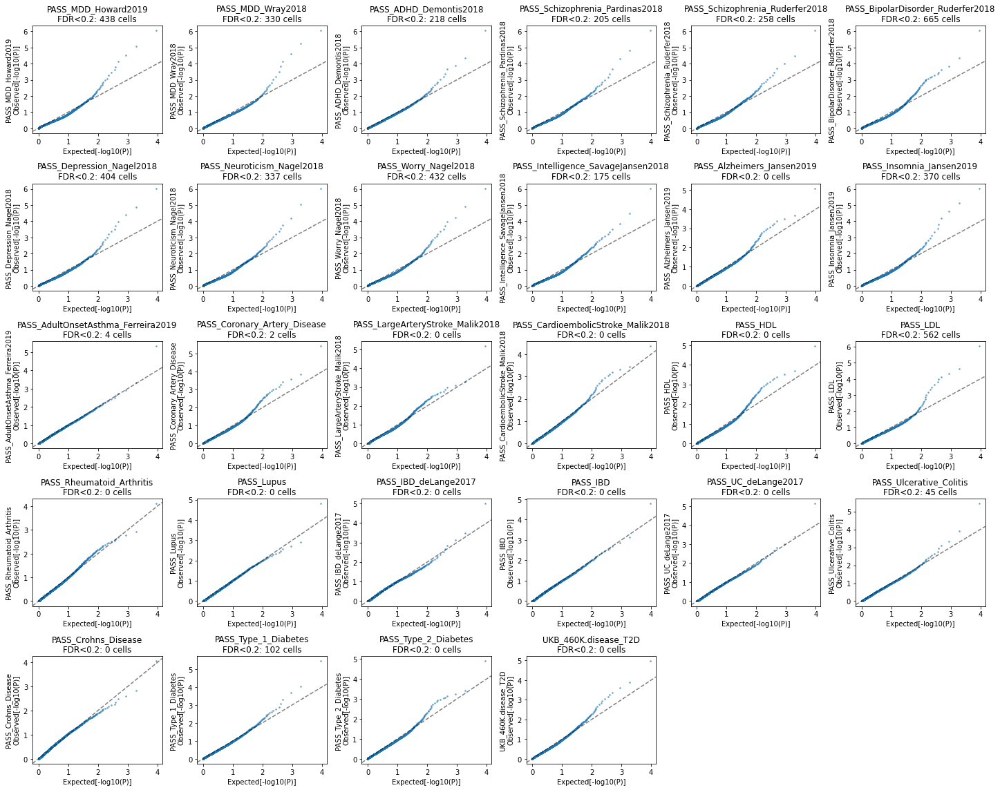

In [60]:
# QQ-plot 
plot_config_list = ['trs_ep']
plot_trait_list = trait_list

normal_x = np.random.rand(10000)
normal_x = -np.log10(normal_x)

for i_config,config in enumerate(plot_config_list):
    plt.figure(figsize=[20, 2+3*len(plot_trait_list)/6])
    for i_trait,trait in enumerate(plot_trait_list): 
        
        v_p = dic_trs['%s;%s'%(trait,config)]
        v_fdr = multipletests(v_p, method='fdr_bh')[1]
        v_nlogp = -np.log10(v_p)
        
        plt.subplot(np.ceil(len(plot_trait_list)/6), 6,i_trait+1)
        util.qqplot(x=normal_x, y=v_nlogp, quantiles=2000, s=3, alpha=0.5)
        plt.axline((1, 1), slope=1, linestyle='--', color='k', alpha=0.5)
        
        plt.title('%s\nFDR<0.2: %d cells'%(trait,(v_fdr<0.2).sum()))
        plt.ylabel('%s\nObserved[-log10(P)]'%trait)
        plt.xlabel('Expected[-log10(P)]')
        
    plt.tight_layout()
#     plt.savefig('/n/holystore01/LABS/price_lab/Users/mjzhang/scTRS_data/result/trait_assoc_090220/qqplot_%s.pdf'%config)
    plt.show()

In [67]:
# Find number of associated cells for each tissue/tissue_celltype

dic_assoc = {'tissue': pd.DataFrame(index=tissue_list, columns=trait_list, data=0),
             'tissue-celltype': pd.DataFrame(index=tc_list, columns=trait_list, data=0)}

df_obs = data_facs_ct.obs.copy()

for trait in trait_list:
    
    v_p = dic_trs['%s;trs_ep'%trait]
    v_fdr = multipletests(v_p, method='fdr_bh')[1]
    
    # tissue
    temp_df = df_obs.loc[v_fdr<0.25].copy()
    temp_df = temp_df.groupby(['tissue']).agg({'cell':len})
    temp_df = temp_df.loc[~temp_df['cell'].isna()]
    dic_assoc['tissue'].loc[temp_df.index, trait] = temp_df['cell'].values
    
    # tissue-cell
    temp_df = df_obs.loc[v_fdr<0.25].copy().copy()
    temp_df = temp_df.groupby(['tissue_celltype']).agg({'cell':len})
    temp_df = temp_df.loc[~temp_df['cell'].isna()]
    dic_assoc['tissue-celltype'].loc[temp_df.index, trait] = temp_df['cell'].values

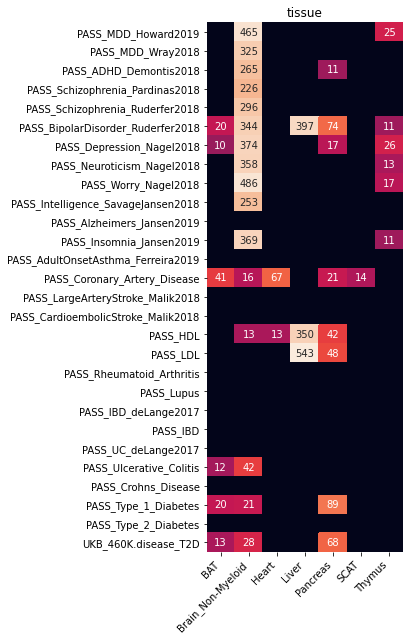

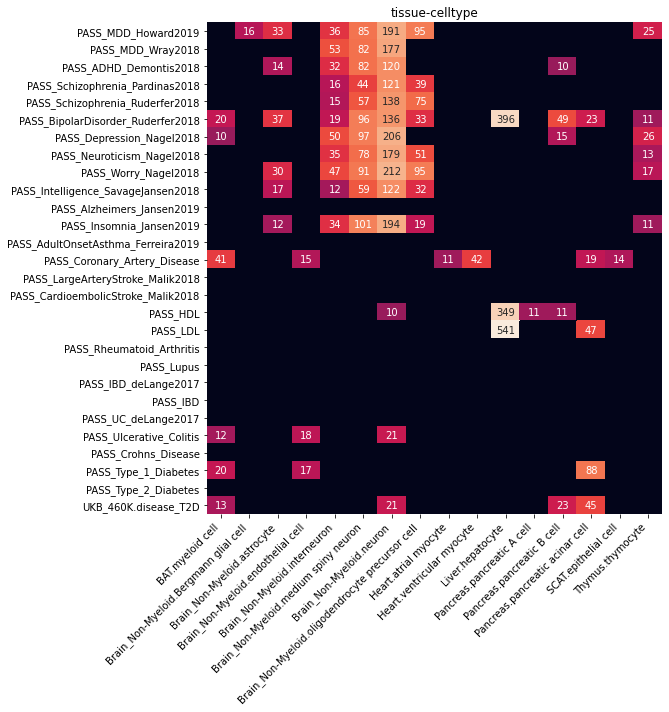

In [68]:
def num2str(x):
    if x>1000:
        return '%0.1fk'%(x/1000)
    elif x>0:
        return '%d'%x
    else:
        return ''
    
for term in dic_assoc.keys():

    df_plot = dic_assoc[term].copy()
    df_plot = df_plot.loc[df_plot.max(axis=1)>10]
    df_plot = df_plot.T
    df_plot[df_plot<10] = 0
    
    mat_annot = np.zeros(df_plot.shape, dtype=object)
    for i_col,col in enumerate(df_plot.columns):
        mat_annot[:,i_col] = [num2str(x) for x in df_plot[col].values]
    df_plot = np.log10(df_plot+1)
    
    plt.figure(figsize=[0.4*df_plot.shape[1]+3, 0.25*df_plot.shape[0]+2+1*('tissue-celltype' in term)])
    sns.heatmap(df_plot, annot=mat_annot, fmt='s', cbar=False)
    plt.xticks(np.arange(df_plot.shape[1])+0.5, df_plot.columns, rotation=45, ha='right')
    plt.title(term)
    plt.tight_layout()
    plt.show()

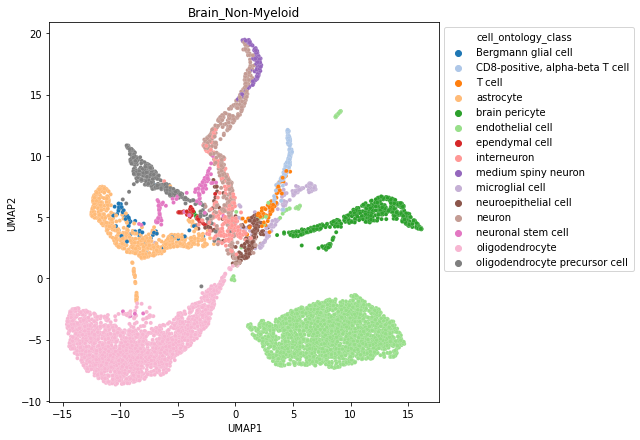

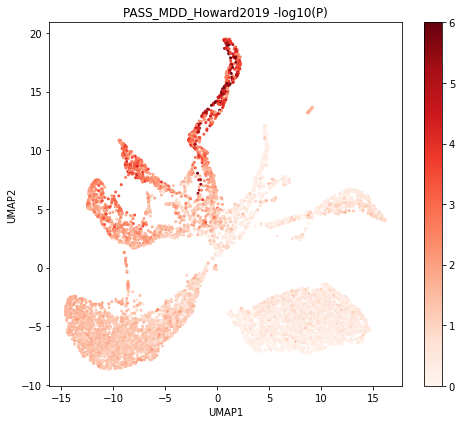

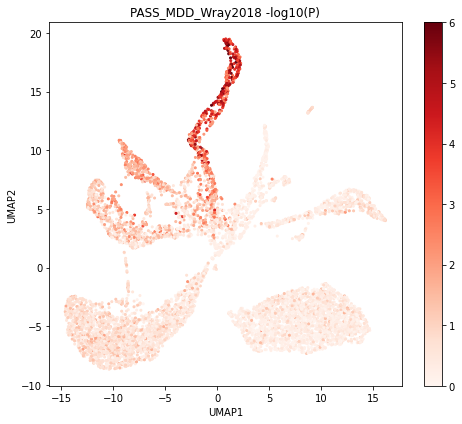

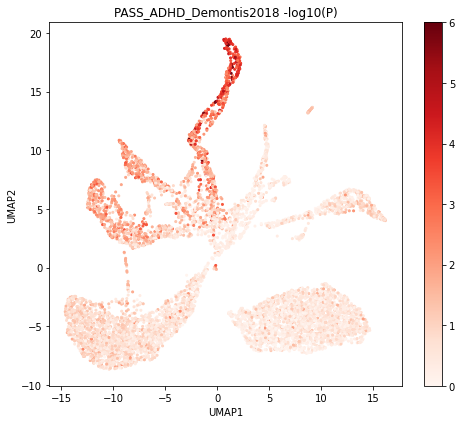

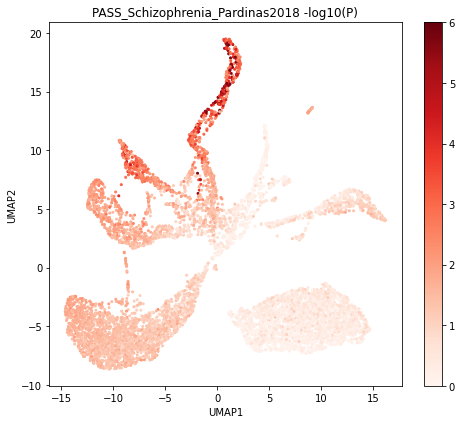

...

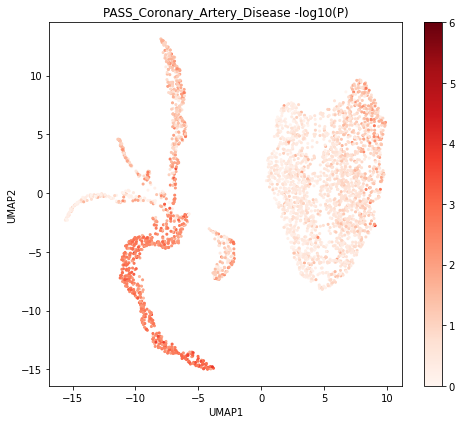

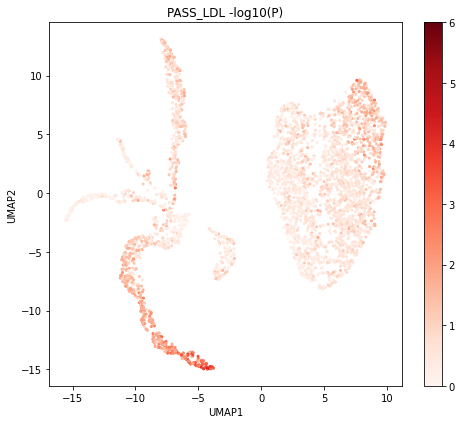

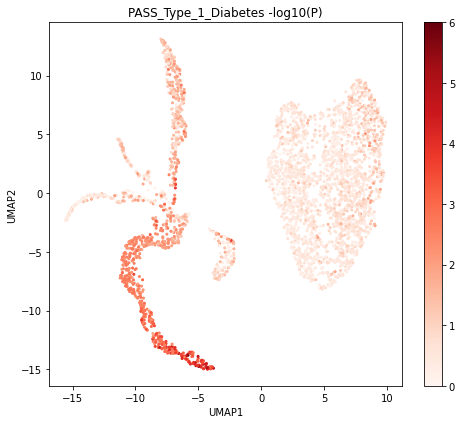

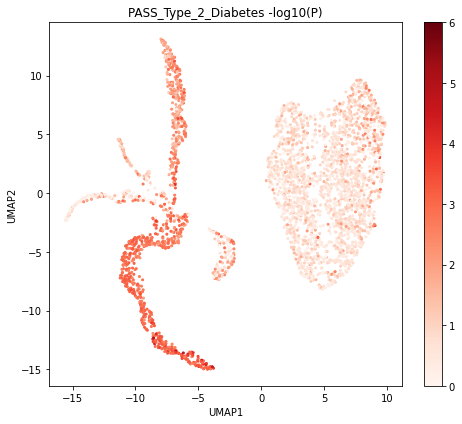

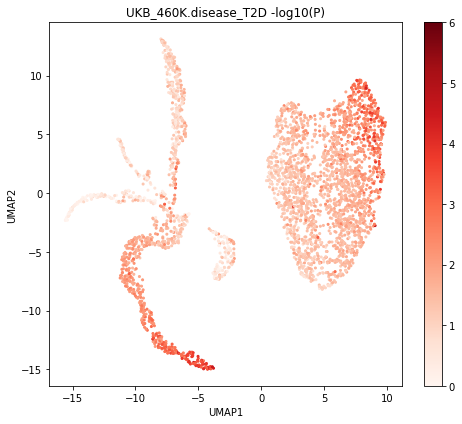

In [78]:
plot_list = [['Brain_Non-Myeloid', 'PASS_MDD_Howard2019'],
             ['Brain_Non-Myeloid', 'PASS_MDD_Wray2018'],
             ['Brain_Non-Myeloid', 'PASS_ADHD_Demontis2018'],
             ['Brain_Non-Myeloid', 'PASS_Schizophrenia_Pardinas2018'],
             ['Brain_Non-Myeloid', 'PASS_Schizophrenia_Ruderfer2018'],
             ['Brain_Non-Myeloid', 'PASS_BipolarDisorder_Ruderfer2018'],
             ['Brain_Non-Myeloid', 'PASS_Depression_Nagel2018'],
             ['Brain_Non-Myeloid', 'PASS_Neuroticism_Nagel2018'],
             ['Brain_Non-Myeloid', 'PASS_Worry_Nagel2018'],
             ['Brain_Non-Myeloid', 'PASS_Intelligence_SavageJansen2018'],
             ['Brain_Non-Myeloid', 'PASS_Alzheimers_Jansen2019'],
             ['Brain_Non-Myeloid', 'PASS_Insomnia_Jansen2019'],
             ['Thymus', 'PASS_Depression_Nagel2018'],
             ['Thymus', 'PASS_Neuroticism_Nagel2018'],
             ['Thymus', 'PASS_Intelligence_SavageJansen2018'],
             ['Heart', 'PASS_Coronary_Artery_Disease'],
             ['Liver', 'PASS_Alzheimers_Jansen2019'],
             ['Liver', 'PASS_HDL'],
             ['Liver', 'PASS_LDL'],
             ['Pancreas', 'PASS_Coronary_Artery_Disease'],
             ['Pancreas', 'PASS_LDL'],
             ['Pancreas', 'PASS_Type_1_Diabetes'],
             ['Pancreas', 'PASS_Type_2_Diabetes'],
             ['Pancreas', 'UKB_460K.disease_T2D']]

tissue_plot = []
for tissue,trait in plot_list:
    
    temp_df = pd.DataFrame(index=data_facs_ct.obs.index)
    temp_df['trs_ep'] = data=dic_trs['%s;trs_ep'%(trait)]
    temp_df['trs_ez'] = data=dic_trs['%s;trs_ez'%(trait)]
    
    df_plot = pd.DataFrame(index=dic_data_facs[tissue].obs.index)
    df_plot['UMAP1'] = dic_data_facs[tissue].obsm['X_umap'][:,0]
    df_plot['UMAP2'] = dic_data_facs[tissue].obsm['X_umap'][:,1]
    df_plot['cell_ontology_class'] = dic_data_facs[tissue].obs['cell_ontology_class']
    
    df_plot['trs_ez'] = temp_df.loc[df_plot.index, 'trs_ez']
    df_plot['trs_ep'] = temp_df.loc[df_plot.index, 'trs_ep']
    df_plot['trs_nlog10p'] = -np.log10(df_plot['trs_ep'])
    
    temp_df = df_plot.groupby('cell_ontology_class').agg({'trs_ez':len})
    celltype_list = list(temp_df.index[temp_df['trs_ez']>25])
    celltype_list.sort()
    celltype_set = set(celltype_list)
    df_plot = df_plot.loc[[x in celltype_set for x in df_plot['cell_ontology_class']]]
    
    if len(celltype_list)<=10:
        palette='tab10'
    else:
        palette='tab20'
    
    if tissue not in tissue_plot:
        tissue_plot.append(tissue)
        plt.figure(figsize=[9,6])
        sns.scatterplot(data=df_plot, x='UMAP1', y='UMAP2', 
                        hue='cell_ontology_class', hue_order=celltype_list, palette=palette,
                        s=16, linewidth=0.1)
        plt.legend(loc="upper left", bbox_to_anchor=(1,1))
        plt.tight_layout()
        plt.title(tissue)
        plt.show()
    
    plt.figure(figsize=[7,6])
    plt.scatter(df_plot['UMAP1'], df_plot['UMAP2'], c=df_plot['trs_nlog10p'],
                cmap='Reds', vmin=0, vmax=6, s=4)
    plt.colorbar()
    plt.xlabel('UMAP1')
    plt.ylabel('UMAP2')
    plt.title('%s -log10(P)'%trait)
    plt.tight_layout()
    plt.show()
    
#     break
    

### Consistency

In [56]:
# Obtain TRS
dic_trs = {}
start_time = time.time()
    
trait = 'PASS_MDD_Wray2018'
ind_select = (dic_geneset[trait]['fdr'].values<0.1)
gene_list = dic_geneset[trait].index[ind_select]


n_ctrl_list = [1,2,5,10,20]
n_rep = 10
dic_res = {x:[] for x in n_ctrl_list}

for n_ctrl in n_ctrl_list:
    for i_rep in range(n_rep):
        md.score_cell(data_facs_ct, gene_list, suffix='',
                      ctrl_opt='mean_match', trs_opt='vst', bc_opt='empi',
                      n_ctrl=n_ctrl, n_genebin=200,
                      return_list=['trs_z', 'trs_tp', 'trs_ep', 'trs_ez'], random_seed=i_rep+0, verbose=False)
        v_z1 = data_facs_ct.obs['trs_ez'].values.copy()
        
        md.score_cell(data_facs_ct, gene_list, suffix='',
                      ctrl_opt='mean_match', trs_opt='vst', bc_opt='empi',
                      n_ctrl=n_ctrl, n_genebin=200,
                      return_list=['trs_z', 'trs_tp', 'trs_ep', 'trs_ez'], random_seed=i_rep+1, verbose=False)
        v_z2 = data_facs_ct.obs['trs_ez'].values.copy()
        
        dic_res[n_ctrl].append(np.corrcoef(v_z1,v_z2)[0,1])
        
    print('# n_ctrl=%d, rep=%d/%d, time=%0.1fs'%(n_ctrl, i_rep, n_rep, time.time()-start_time))

# n_ctrl=1, rep=9/10, time=61.7s
# n_ctrl=2, rep=9/10, time=152.4s
# n_ctrl=5, rep=9/10, time=328.9s
# n_ctrl=10, rep=9/10, time=648.0s
# n_ctrl=20, rep=9/10, time=1257.0s


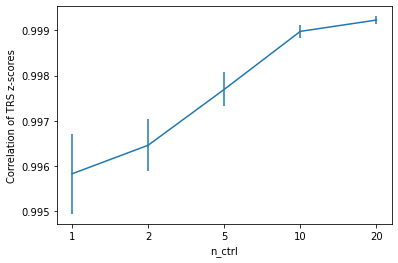

In [80]:
df_plot = pd.DataFrame(index=n_ctrl_list, columns=['mean', 'se'], data=0)
for n_ctrl in n_ctrl_list:
    v_corr = np.array(dic_res[n_ctrl])
    df_plot.loc[n_ctrl] = v_corr.mean(),v_corr.std()/np.sqrt(v_corr.shape[0])
df_plot['loc'] = np.arange(df_plot.shape[0])
plt.figure()
plt.errorbar(df_plot['loc'], df_plot['mean'], yerr=df_plot['se'])
plt.xticks(df_plot['loc'], df_plot.index)
plt.xlabel('n_ctrl')
plt.ylabel('Correlation of TRS z-scores')
plt.show()

### Old code 